In [1]:
import torch

sample_size = 0.01
use_sample = True
device = "cuda" if torch.cuda.is_available() else "cpu"
onnx_path = "autoencoder.onnx"

trained_model_path = "saved_models/autoencoder_Model_1_hidden[14, 12]_latent10_lr0.001_bs256_optrmsprop_actLeakyReLU_slp0.2_wd0.pth"
existing_model_architecture = {
    "input_dim": 16,
    "hidden_dims": [14, 12],
    "latent_dim": 10,
    "activation_type": "LeakyReLU",
    "negative_slope": 0.2,
    "output_activation_type": "Sigmoid",
}

train_set_path = (
    "/home/jbct/Projects/thesis/db-ocsvm/data/processed/CIDDS-001/train_set_full.csv"
)
test_set_path = (
    "/home/jbct/Projects/thesis/db-ocsvm/data/processed/CIDDS-001/test_set.csv"
)

In [2]:
dbscan_parameters = {
    "eps": 1.787311276337387,
    "min_samples": 29,
    "distance_metric": "manhattan",
    "score": 0.4514608383178711,
}

tree_alogrithm_parameter = "ball_tree"

dbocsvm_parameter_list = {
    0: {"kernel": "rbf", "gamma": 0.6749850177017664, "nu": 0.3956772361821075},
    1: {"kernel": "rbf", "gamma": 0.5382840782127776, "nu": 0.011519277593471742},
    2: {"kernel": "rbf", "gamma": 0.6760178250552376, "nu": 0.06307402235246268},
    3: {"kernel": "rbf", "gamma": 0.7126590670330865, "nu": 0.06057021076474931},
    4: {"kernel": "rbf", "gamma": 0.43393514090957325, "nu": 0.0714240292185416},
    5: {"kernel": "rbf", "gamma": 0.9517259890980925, "nu": 0.3276133623126268},
    6: {"kernel": "rbf", "gamma": 0.2105087862996638, "nu": 0.10704277141309872},
    7: {"kernel": "rbf", "gamma": 0.40570553555679434, "nu": 0.4854848861673181},
    8: {"kernel": "rbf", "gamma": 0.7437204380559609, "nu": 0.3450585844550152},
    9: {"kernel": "rbf", "gamma": 0.4904715339167893, "nu": 0.05866339891711346},
    10: {"kernel": "rbf", "gamma": 0.3525616981336645, "nu": 0.11258335148635641},
    11: {"kernel": "rbf", "gamma": 0.8394655474399617, "nu": 0.014396303218355359},
    12: {"kernel": "rbf", "gamma": 0.966790981718318, "nu": 0.35955258309738003},
    13: {"kernel": "rbf", "gamma": 0.40569205407720194, "nu": 0.15473416045029326},
    14: {"kernel": "rbf", "gamma": 0.7802232942940553, "nu": 0.33277673425852156},
    15: {"kernel": "rbf", "gamma": 0.47913938510822796, "nu": 0.0849304514637937},
    16: {"kernel": "rbf", "gamma": 0.8815413846424647, "nu": 0.06496299084584861},
    17: {"kernel": "rbf", "gamma": 0.658179889282608, "nu": 0.2958789542792919},
    18: {"kernel": "rbf", "gamma": 0.2656093223502789, "nu": 0.23132614193252973},
    19: {"kernel": "rbf", "gamma": 0.9288753597450893, "nu": 0.4523412126896116},
    20: {"kernel": "rbf", "gamma": 0.1537475516837271, "nu": 0.23998315552744287},
    21: {"kernel": "rbf", "gamma": 0.7440255543987286, "nu": 0.012471419048979998},
    22: {"kernel": "rbf", "gamma": 0.6826805563290459, "nu": 0.2088530681181794},
    23: {"kernel": "rbf", "gamma": 0.5720789151209829, "nu": 0.34361483253223735},
    24: {"kernel": "rbf", "gamma": 0.5091042324615142, "nu": 0.18362802550012192},
    25: {"kernel": "rbf", "gamma": 0.39324526774738006, "nu": 0.30018911635517903},
    26: {"kernel": "rbf", "gamma": 0.11072003753199025, "nu": 0.10562894182999995},
    27: {"kernel": "rbf", "gamma": 0.16060182837914166, "nu": 0.1625869530357687},
    28: {"kernel": "rbf", "gamma": 0.8862387459902442, "nu": 0.2856752422997735},
    29: {"kernel": "rbf", "gamma": 0.7737268500004805, "nu": 0.06490415711757859},
    30: {"kernel": "rbf", "gamma": 0.2982692363201671, "nu": 0.2682792918743827},
    31: {"kernel": "rbf", "gamma": 0.9593034375847778, "nu": 0.4234419103858413},
    32: {"kernel": "rbf", "gamma": 0.5510395673977838, "nu": 0.35802896324024025},
    33: {"kernel": "rbf", "gamma": 0.7628631528017598, "nu": 0.45754063046701976},
    34: {"kernel": "rbf", "gamma": 0.9610045012036982, "nu": 0.4350232780924957},
    35: {"kernel": "rbf", "gamma": 0.9043870319578275, "nu": 0.12459124094840476},
    36: {"kernel": "rbf", "gamma": 0.776877026765261, "nu": 0.4866898392064121},
    37: {"kernel": "rbf", "gamma": 0.9972865655411062, "nu": 0.2749360631616554},
    38: {"kernel": "rbf", "gamma": 0.642919009119658, "nu": 0.2641844103392809},
    39: {"kernel": "rbf", "gamma": 0.6207461915783272, "nu": 0.09963239899111537},
    40: {"kernel": "rbf", "gamma": 0.5995094745977826, "nu": 0.10752175690717974},
    41: {"kernel": "rbf", "gamma": 0.7602690087833293, "nu": 0.1408885493562113},
    42: {"kernel": "rbf", "gamma": 0.8795809728492018, "nu": 0.13314053460265152},
    43: {"kernel": "rbf", "gamma": 0.21020522465525246, "nu": 0.4389780274338308},
    44: {"kernel": "rbf", "gamma": 0.3112507342569375, "nu": 0.03783535940274117},
    45: {"kernel": "rbf", "gamma": 0.024006951870270698, "nu": 0.03369206491746739},
    46: {"kernel": "rbf", "gamma": 0.15046762791657775, "nu": 0.2247197624426874},
    47: {"kernel": "rbf", "gamma": 0.8585461277526101, "nu": 0.3057315857770464},
}

import dataset

In [3]:
import pandas as pd

train_df = pd.read_csv(train_set_path)
if use_sample:
    train_df = train_df.sample(frac=sample_size, random_state=42).reset_index(drop=True)

print(train_df.shape)
train_df.head(1)

(1800, 18)


,duration,packets,bytes,flows,tcp_urg,tcp_ack,tcp_psh,tcp_rst,tcp_syn,tcp_fin,tos,attack_id,proto_ICMP,proto_IGMP,proto_TCP,proto_UDP,attack_binary,attack_categorical
0,0.001965,0.000032,0.000007,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,benign


In [4]:
X_train = train_df.drop(columns=["attack_binary", "attack_categorical"]).values
y_train = train_df["attack_binary"].values

print(X_train.shape)

(1800, 16)


In [5]:
import torch
from torch.utils.data import TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train)

# Create data loaders
X_train_dataset = TensorDataset(X_train_tensor)

input_dim = X_train.shape[1]

load trained autoencoder

In [6]:
from autoencoder import BatchNormAutoencoder

autoencoder = BatchNormAutoencoder(
    input_dim=existing_model_architecture["input_dim"],
    hidden_dims=existing_model_architecture["hidden_dims"],
    latent_dim=existing_model_architecture["latent_dim"],
    activation_type=existing_model_architecture["activation_type"],
    negative_slope=existing_model_architecture["negative_slope"],
    output_activation_type=existing_model_architecture["output_activation_type"],
)

In [7]:
# Load best model
checkpoint = torch.load(trained_model_path)
autoencoder.load_state_dict(checkpoint["model_state_dict"])

autoencoder.eval()

BatchNormAutoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=16, out_features=14, bias=True)
    (1): BatchNorm1d(14, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=14, out_features=12, bias=True)
    (4): BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=12, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=10, out_features=12, bias=True)
    (1): BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=12, out_features=14, bias=True)
    (4): BatchNorm1d(14, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=14, out_features=16, bias=True)
    (7): Sigmoid()
  )
)

import test set

In [8]:
test_df = pd.read_csv(test_set_path)
print(test_df.shape)
print(test_df["attack_categorical"].value_counts())
test_df.head(1)

(20000, 18)
attack_categorical
benign        11226
dos            5564
portScan       1730
bruteForce      804
pingScan        676
Name: count, dtype: int64


,duration,packets,bytes,flows,tcp_urg,tcp_ack,tcp_psh,tcp_rst,tcp_syn,tcp_fin,tos,attack_id,proto_ICMP,proto_IGMP,proto_TCP,proto_UDP,attack_binary,attack_categorical
0,0.00064,0.000021,0.000002,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,1.0,0.0,1,benign


In [9]:
# Splitting into X and y
X_test = test_df.drop(columns=["attack_binary", "attack_categorical"]).values
y_test = test_df["attack_binary"].values
y_test_class = test_df["attack_categorical"]

In [10]:
import shap
import numpy as np


# Create a wrapper function for the autoencoder that returns reconstruction error
class AutoencoderWrapper:
    def __init__(self, autoencoder):
        self.autoencoder = autoencoder

    def __call__(self, X):
        # Convert to tensor
        X_tensor = torch.FloatTensor(X).to(device)

        # Get reconstruction
        with torch.no_grad():
            reconstructed = self.autoencoder(X_tensor)

        # Calculate reconstruction error per sample
        reconstruction_error = (
            ((reconstructed - X_tensor) ** 2).mean(dim=1).cpu().numpy()
        )
        return reconstruction_error


# Initialize the wrapper
model_wrapper = AutoencoderWrapper(autoencoder)

# Create a background dataset (subset of training data)
# background_data = X_train_full[:1000]  # Using a subset for computational efficiency
background_data = shap.kmeans(X_train, 100)  # Use 100 representative centroids

# Initialize SHAP explainer
explainer = shap.KernelExplainer(model_wrapper, background_data)

# Sample a subset of test data for SHAP analysis (for efficiency)
test_sample_indices = np.random.choice(len(X_test), min(1, len(X_test)), replace=False)
test_sample = X_test[test_sample_indices]

# Calculate SHAP values
shap_values = explainer.shap_values(test_sample)

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 1/1 [00:00<00:00,  8.37it/s]


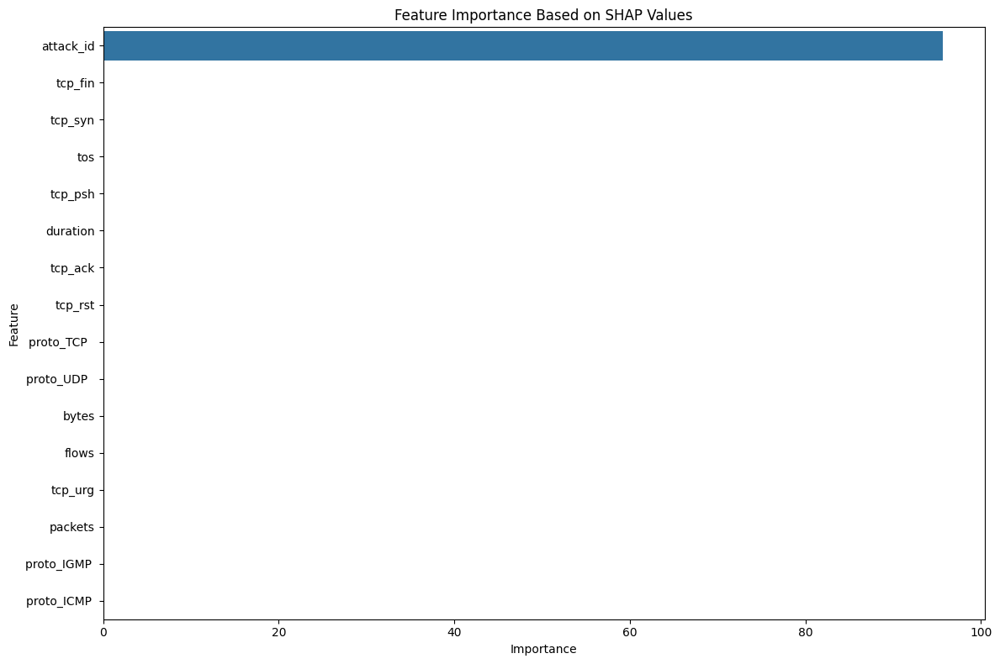

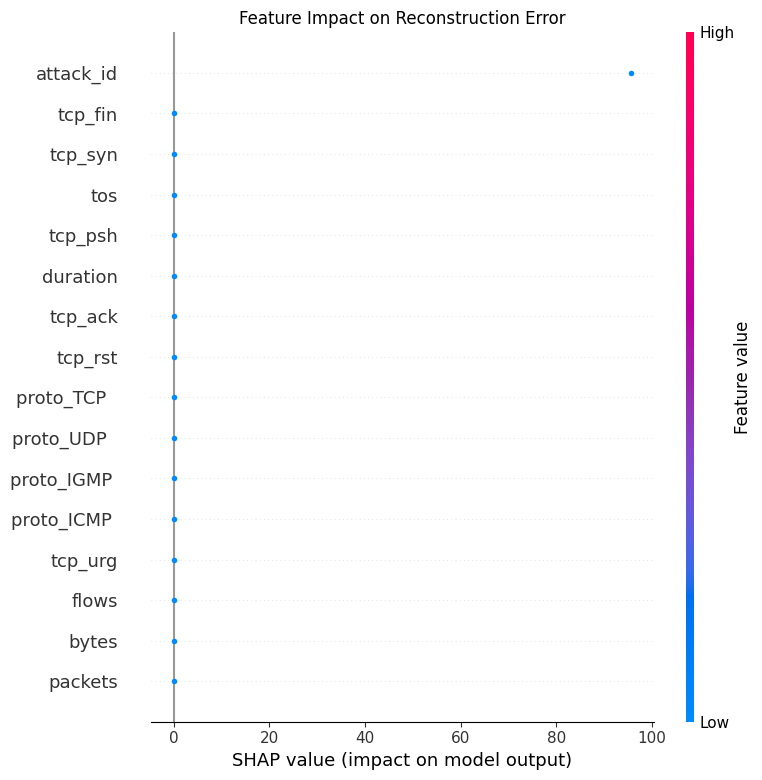

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert test_sample to DataFrame with feature names
feature_names = test_df.drop(columns=["attack_binary", "attack_categorical"]).columns
test_sample_df = pd.DataFrame(test_sample, columns=feature_names)

# Alternative approach for SHAP feature importance visualization
plt.figure(figsize=(12, 8))

# Calculate mean absolute SHAP values for each feature
feature_importance = np.abs(shap_values).mean(0)
feature_importance_df = pd.DataFrame(
    {"Feature": feature_names, "Importance": feature_importance}
)

# Sort by importance
feature_importance_df = feature_importance_df.sort_values(
    "Importance", ascending=False
).reset_index(drop=True)

# Take top 20 features
top_features = feature_importance_df.head(20)

# Create standard matplotlib bar plot
sns.barplot(x="Importance", y="Feature", data=top_features)
plt.title("Feature Importance Based on SHAP Values")
plt.tight_layout()
plt.savefig("shap_feature_importance_alt.png", bbox_inches="tight", dpi=300)
plt.show()

# The second plot might work with the direct SHAP approach
plt.figure(figsize=(12, 10))
shap.summary_plot(shap_values, test_sample_df, max_display=20, show=False)
plt.title("Feature Impact on Reconstruction Error")
plt.tight_layout()
plt.savefig("shap_feature_impact.png", bbox_inches="tight", dpi=300)
plt.show()

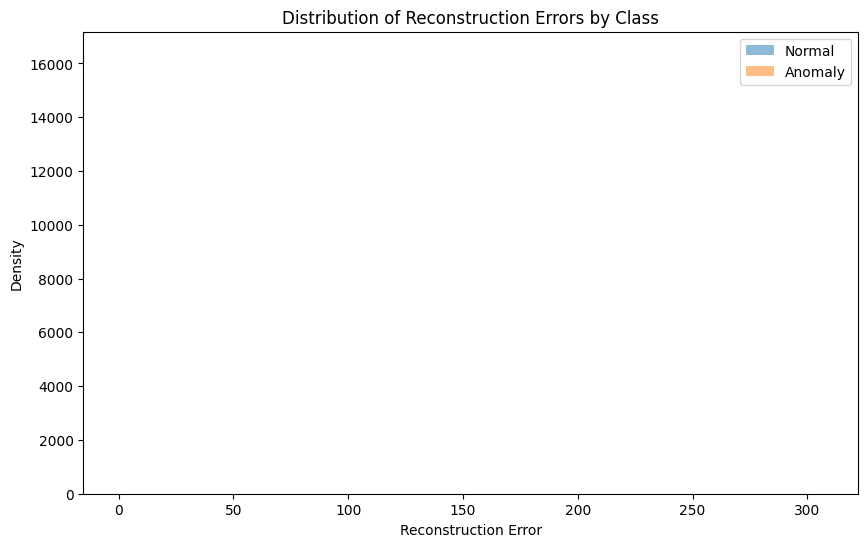

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2999: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3000: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


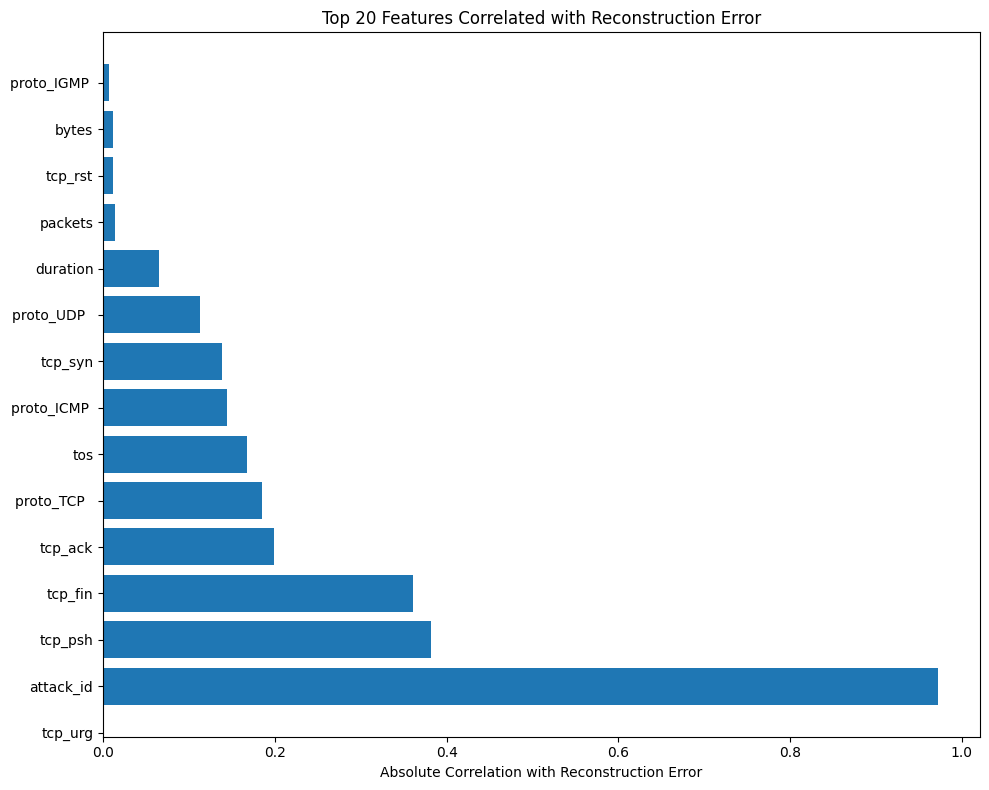

In [12]:
from torch.utils.data import DataLoader


# Calculate reconstruction errors for all test data
def calculate_reconstruction_errors(data, model):
    errors = []
    batch_size = 256
    data_tensor = torch.FloatTensor(data).to(device)
    dataset = TensorDataset(data_tensor)
    loader = DataLoader(dataset, batch_size=batch_size)

    with torch.no_grad():
        for batch in loader:
            inputs = batch[0]
            outputs = model(inputs)
            error = ((outputs - inputs) ** 2).mean(dim=1)
            errors.append(error.cpu().numpy())

    return np.concatenate(errors)


# Get reconstruction errors for test data
test_errors = calculate_reconstruction_errors(X_test, autoencoder)

# Plot distribution of reconstruction errors by class
plt.figure(figsize=(10, 6))
plt.hist(test_errors[y_test == 1], bins=50, alpha=0.5, label="Normal", density=True)
plt.hist(test_errors[y_test == -1], bins=50, alpha=0.5, label="Anomaly", density=True)
plt.legend()
plt.xlabel("Reconstruction Error")
plt.ylabel("Density")
plt.title("Distribution of Reconstruction Errors by Class")
plt.show()

# Calculate correlations between feature values and reconstruction error
feature_names = test_df.drop(columns=["attack_binary", "attack_categorical"]).columns
correlations = []

for i in range(X_test.shape[1]):
    corr = np.corrcoef(X_test[:, i], test_errors)[0, 1]
    correlations.append((feature_names[i], abs(corr)))

# Sort by correlation strength
correlations.sort(key=lambda x: x[1], reverse=True)

# Plot top 20 correlations
plt.figure(figsize=(10, 8))
top_features = [x[0] for x in correlations[:20]]
top_correlations = [x[1] for x in correlations[:20]]
plt.barh(top_features, top_correlations)
plt.xlabel("Absolute Correlation with Reconstruction Error")
plt.title("Top 20 Features Correlated with Reconstruction Error")
plt.tight_layout()
plt.show()

In [13]:
from sklearn.metrics import precision_recall_curve

# Print top 10 most important features according to SHAP
feature_importance = np.abs(shap_values).mean(0)
feature_importance_dict = {
    feature_names[i]: feature_importance[i] for i in range(len(feature_names))
}
sorted_features = sorted(
    feature_importance_dict.items(), key=lambda x: x[1], reverse=True
)

print("Top 10 most important features according to SHAP analysis:")
for feature, importance in sorted_features[:10]:
    print(f"{feature}: {importance:.6f}")

# Compare with correlation analysis
print("\nTop 10 features most correlated with reconstruction error:")
for feature, correlation in correlations[:10]:
    print(f"{feature}: {correlation:.6f}")

# Calculate how many anomalies could be detected by reconstruction error alone
# using a simple threshold-based approach

# Find optimal threshold
precision, recall, thresholds = precision_recall_curve(y_test == -1, test_errors)
f1_scores = 2 * precision * recall / (precision + recall + 1e-10)
optimal_threshold = thresholds[np.argmax(f1_scores)]

# Apply threshold
predicted_anomalies = test_errors > optimal_threshold

# Calculate metrics
accuracy = np.mean(predicted_anomalies == (y_test == -1))
precision = np.sum(predicted_anomalies & (y_test == -1)) / (
    np.sum(predicted_anomalies) + 1e-10
)
recall = np.sum(predicted_anomalies & (y_test == -1)) / (np.sum(y_test == -1) + 1e-10)
f1 = 2 * precision * recall / (precision + recall + 1e-10)

print(f"\nUsing only reconstruction error for anomaly detection:")
print(f"Optimal threshold: {optimal_threshold:.6f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print(
    "\nCompared to the hybrid DBOCSVM model performance above, we can see how the clustering and"
)
print(
    "multiple One-Class SVM approach enhances detection compared to using reconstruction error alone."
)

Top 10 most important features according to SHAP analysis:
attack_id: 95.644100
tcp_fin: 0.027104
tcp_syn: 0.012752
tos: 0.001184
tcp_psh: 0.000612
duration: 0.000505
tcp_ack: 0.000347
tcp_rst: 0.000304
proto_TCP  : 0.000293
proto_UDP  : 0.000198

Top 10 features most correlated with reconstruction error:
flows: nan
tcp_urg: nan
attack_id: 0.972535
tcp_psh: 0.381922
tcp_fin: 0.360891
tcp_ack: 0.199341
proto_TCP  : 0.184593
tos: 0.167516
proto_ICMP : 0.144459
tcp_syn: 0.139011

Using only reconstruction error for anomaly detection:
Optimal threshold: 0.062500
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9997
F1 Score: 0.9998

Compared to the hybrid DBOCSVM model performance above, we can see how the clustering and
multiple One-Class SVM approach enhances detection compared to using reconstruction error alone.


Training the DBOCSVM

In [14]:
from torch.utils.data import DataLoader
import numpy as np

# extract encoded features
X_train_loader = DataLoader(X_train_dataset, batch_size=256)

# Extract in batches to prevent memory issues
X_train_full_encoded = []
with torch.no_grad():
    for data in X_train_loader:
        data_x = data[0].to(device)
        encoded = autoencoder.encode(data_x)
        X_train_full_encoded.append(encoded.cpu().numpy())
X_train_full_encoded = np.vstack(X_train_full_encoded)

In [15]:
from db_ocsvm_04 import DBOCSVM

dbocsvm = DBOCSVM(
    kernel="rbf",
    gamma="auto",
    nu=0.2,
    eps=dbscan_parameters["eps"],
    min_samples=dbscan_parameters["min_samples"],
    dbscan_distance_metric=dbscan_parameters["distance_metric"],
    tree_algorithm=tree_alogrithm_parameter,
)

In [16]:
dbocsvm.fit_cluster(X_train_full_encoded, verbose=True)

Fitting DBSCAN...
DBSCAN Fitted...
Unique Clusters: [-1  0  1  2  3  4  5  6]
Cluster Sizes: {-1: 83, 0: 511, 1: 387, 2: 348, 3: 248, 4: 32, 5: 119, 6: 72}


In [17]:
dbocsvm.fit_ocsvm(X_train_full_encoded, parameter_list=dbocsvm_parameter_list)

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


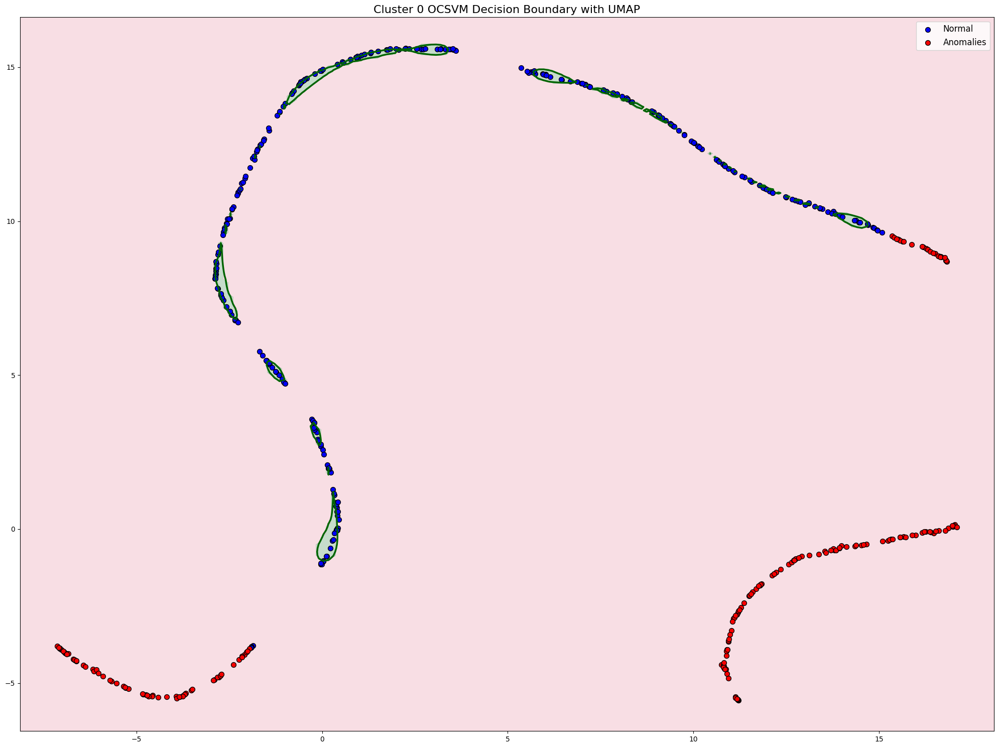

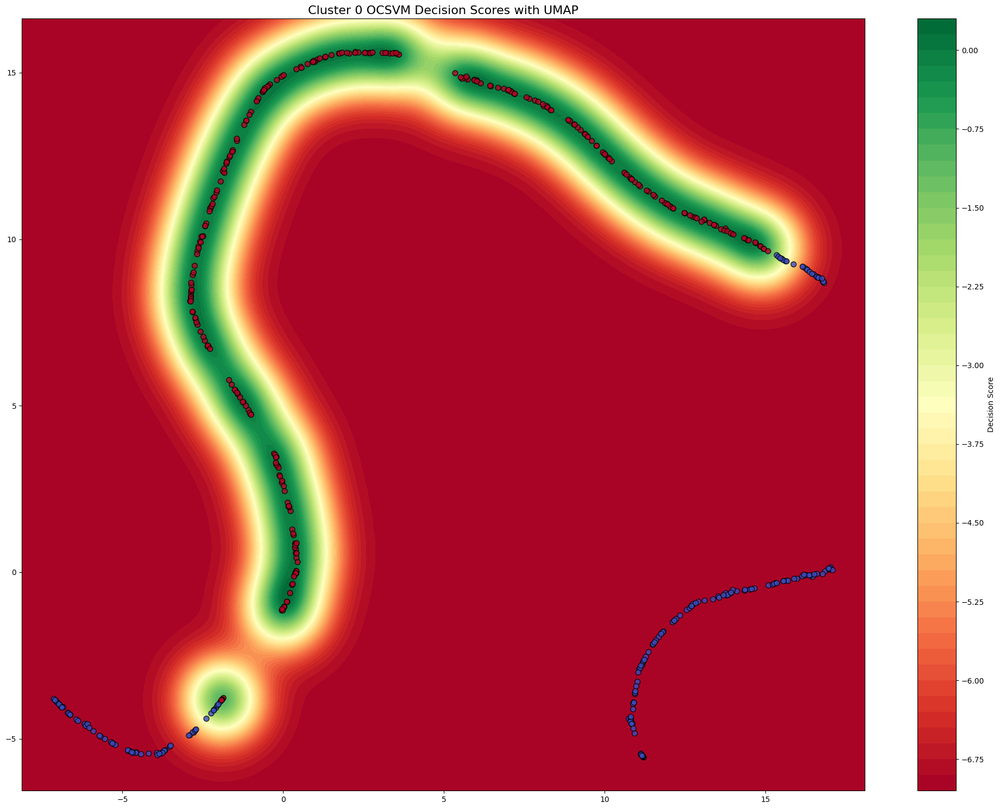

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


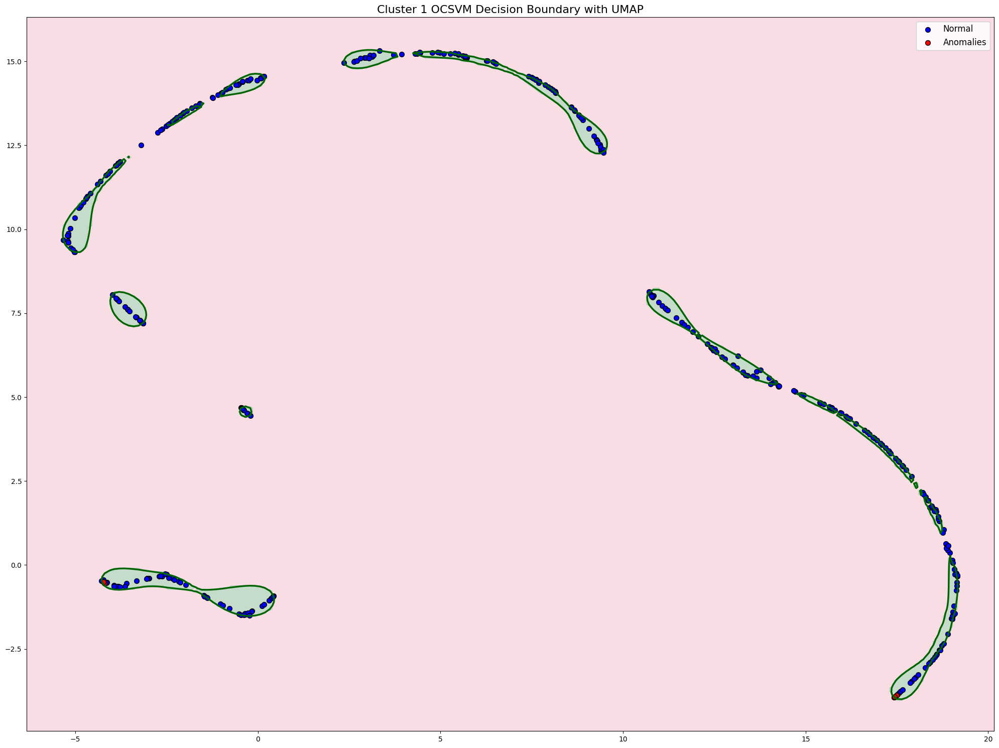

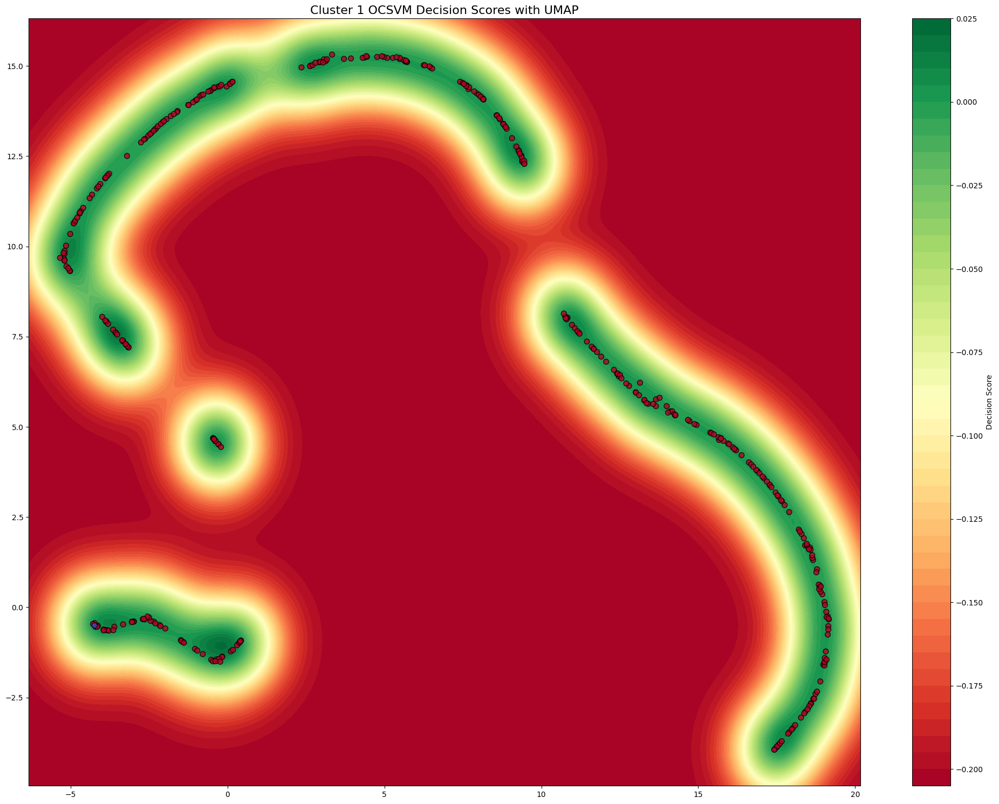

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


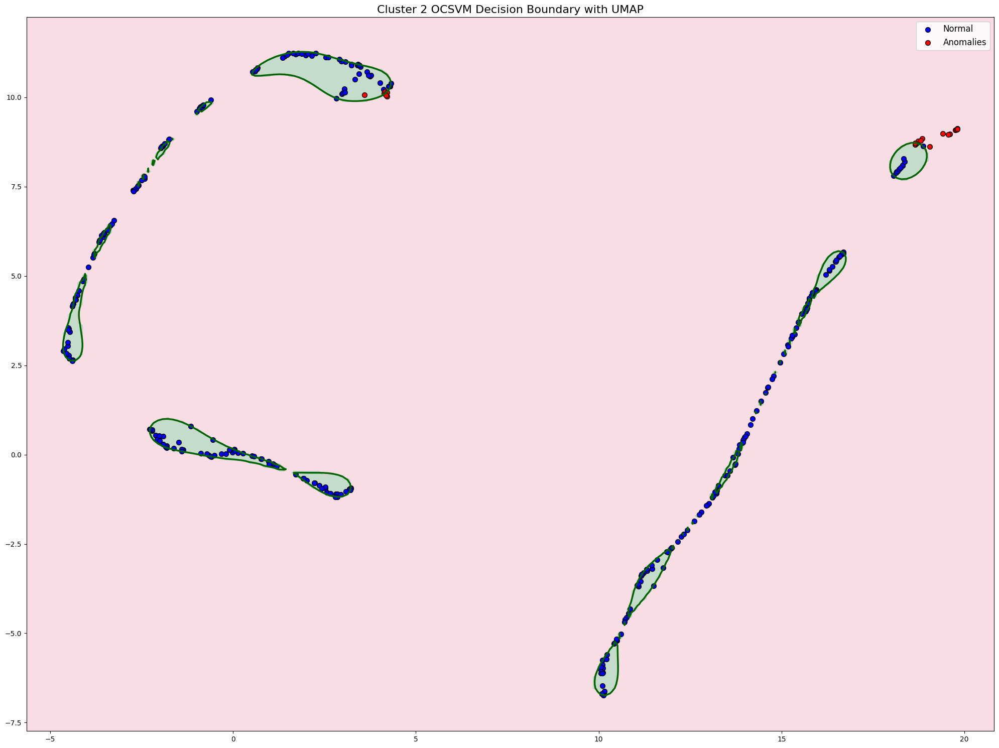

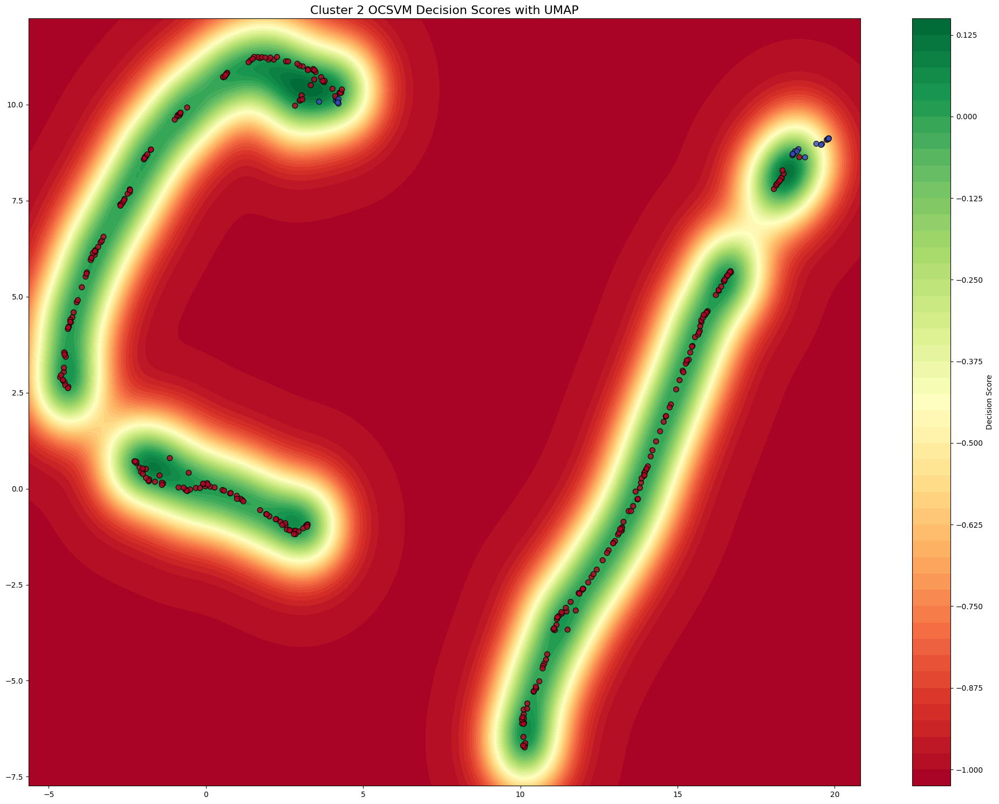

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


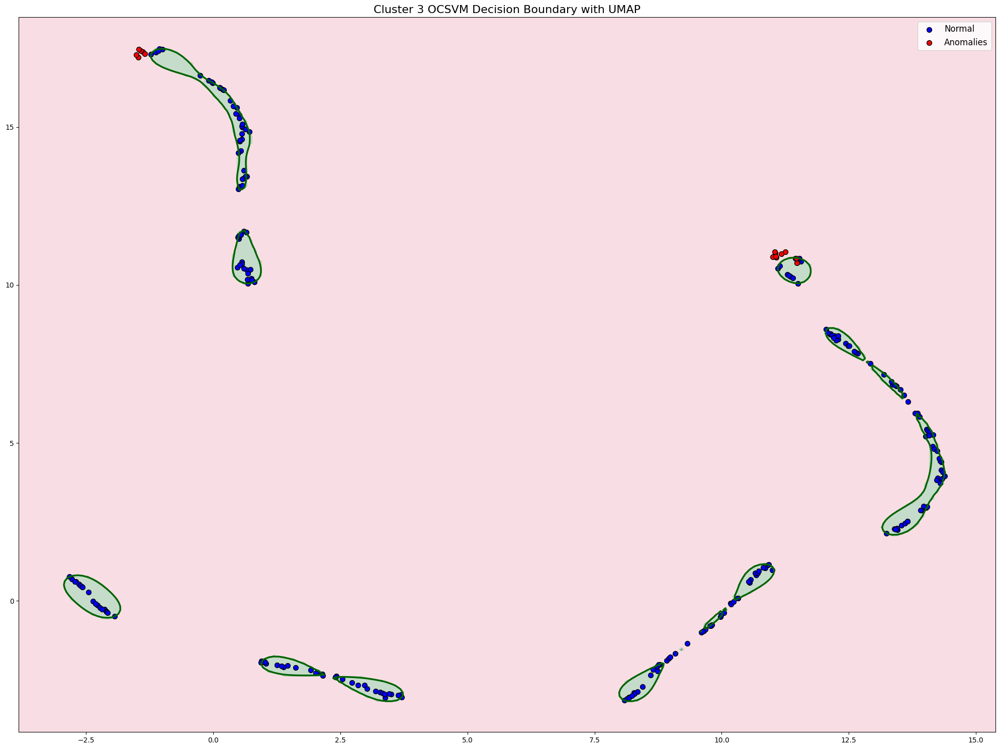

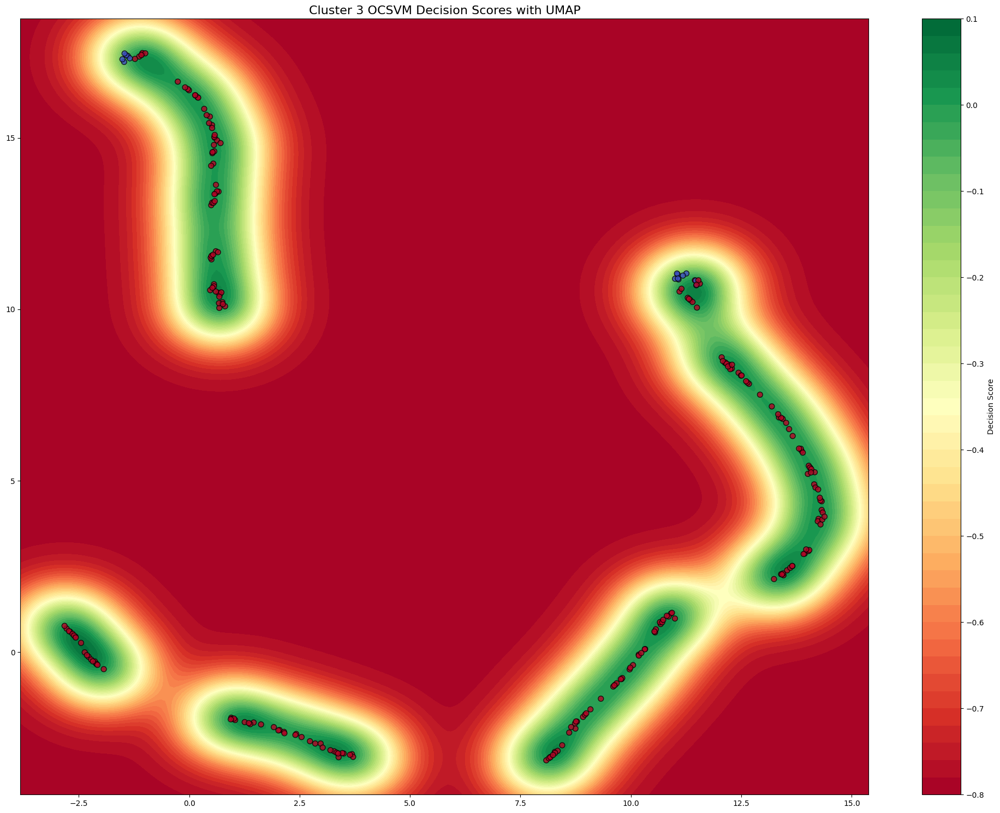

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


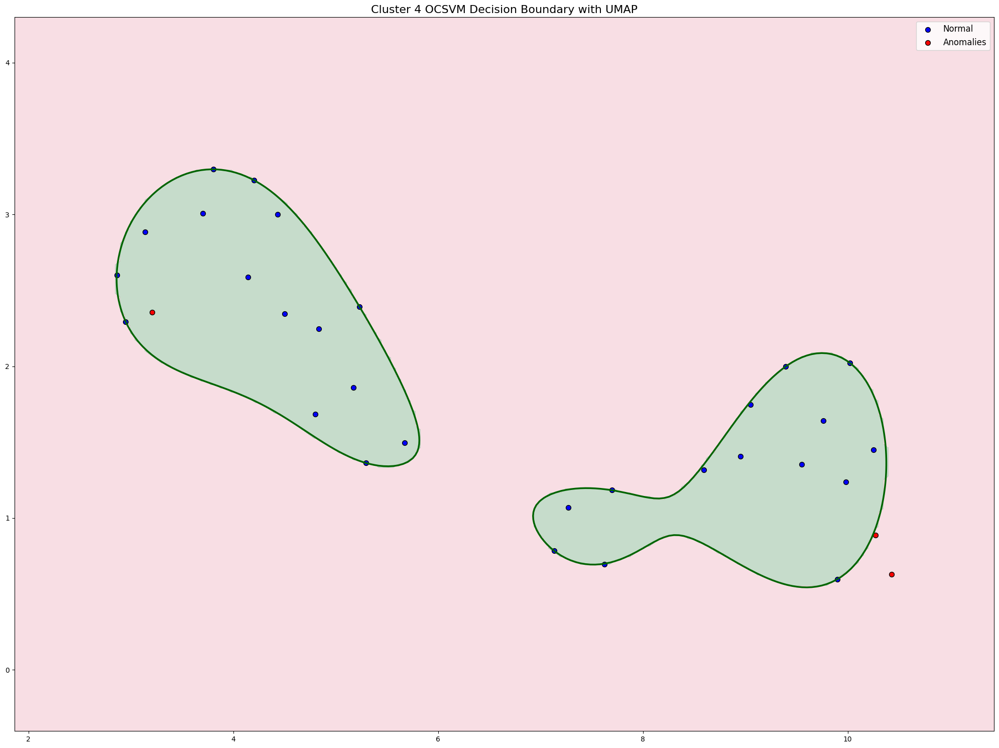

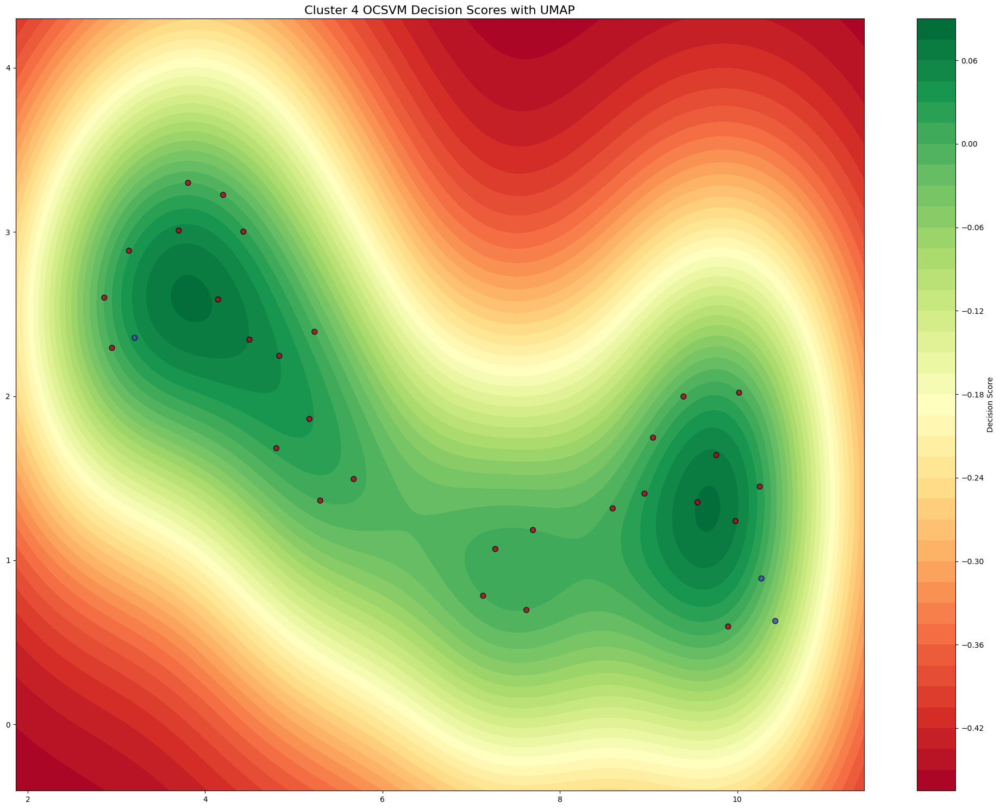

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


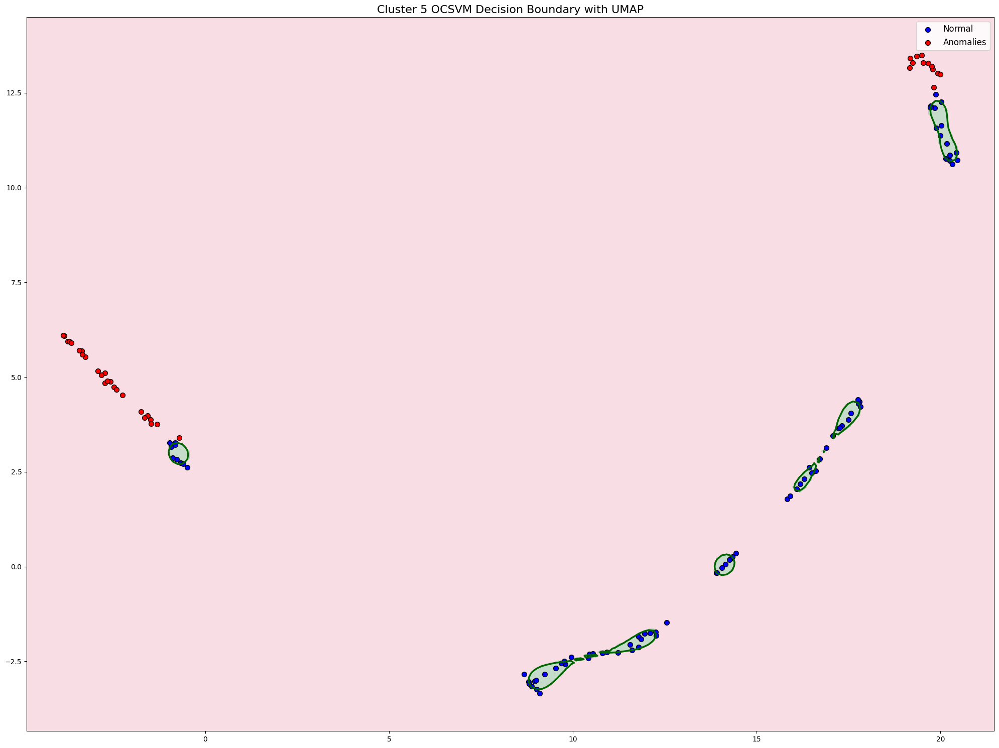

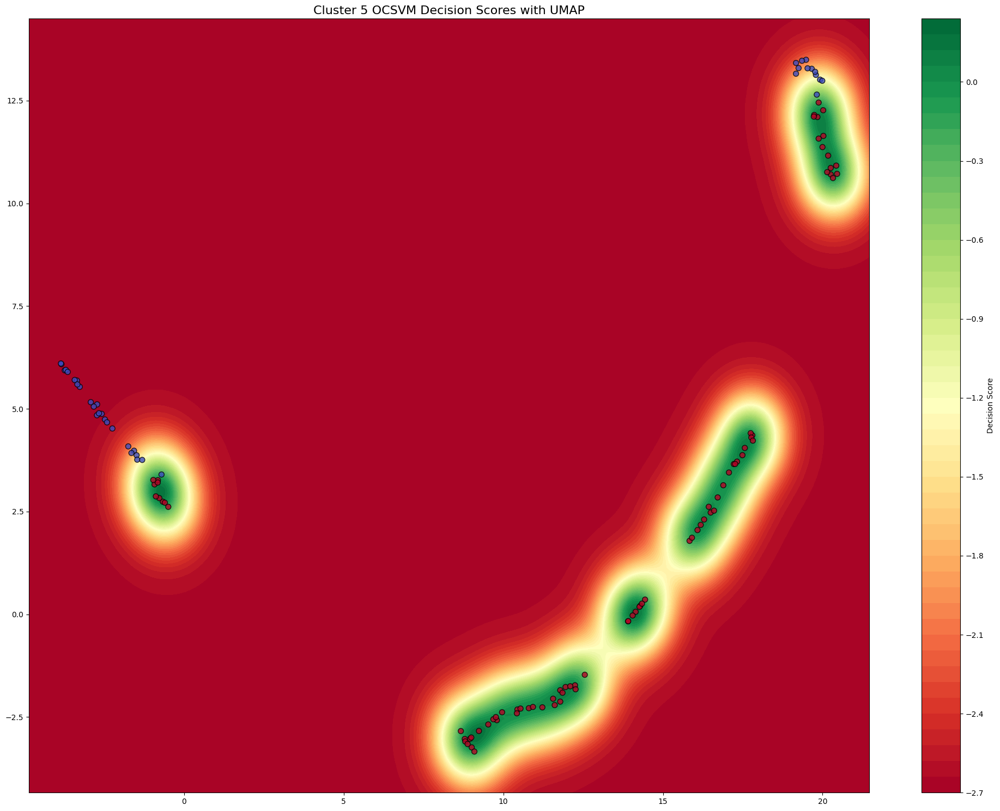

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


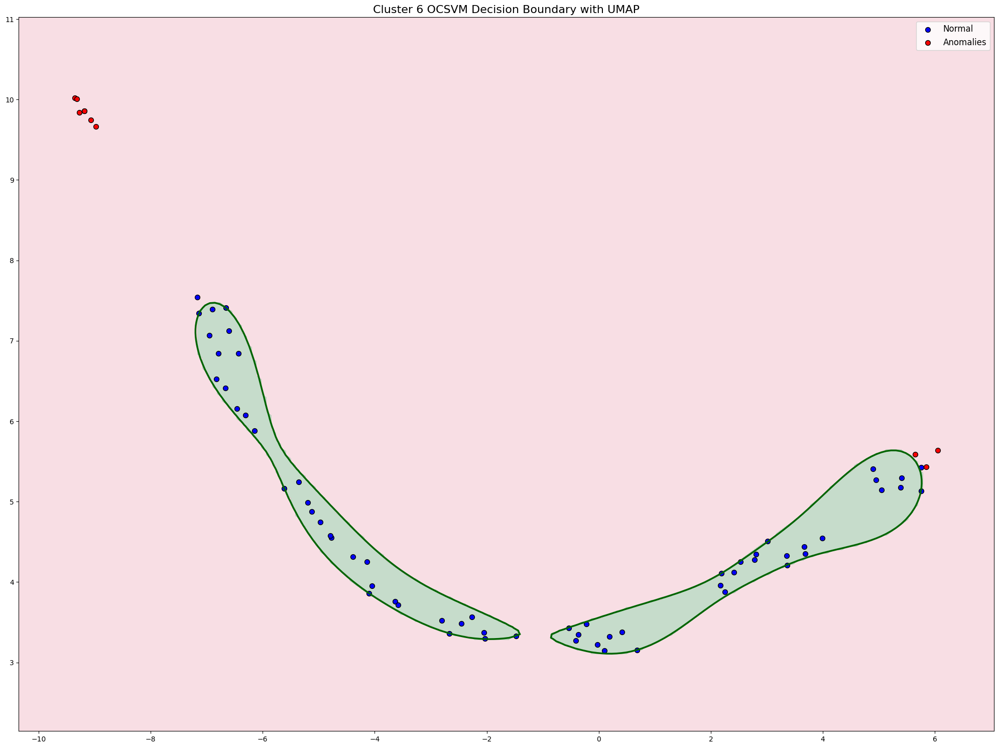

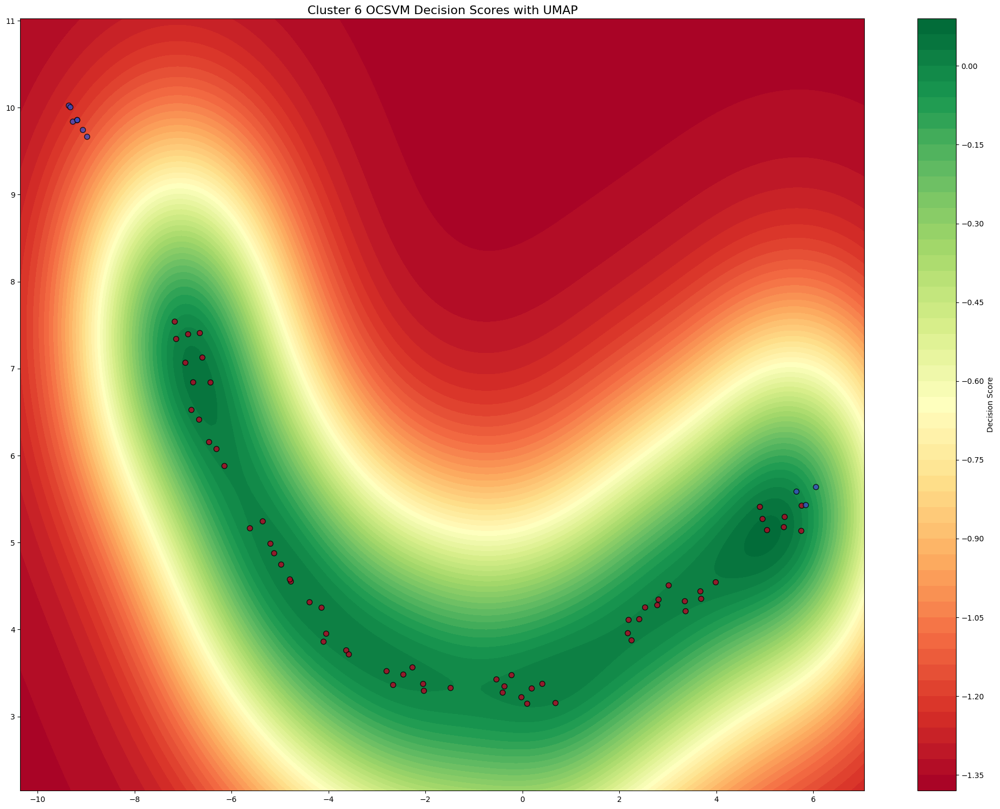

{np.int64(0): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(1): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(2): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(3): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(4): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(5): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_for

In [18]:
# Visualize all decision boundaries using UMAP (default)
dbocsvm.visualize_decision_boundaries(X_train_full_encoded)

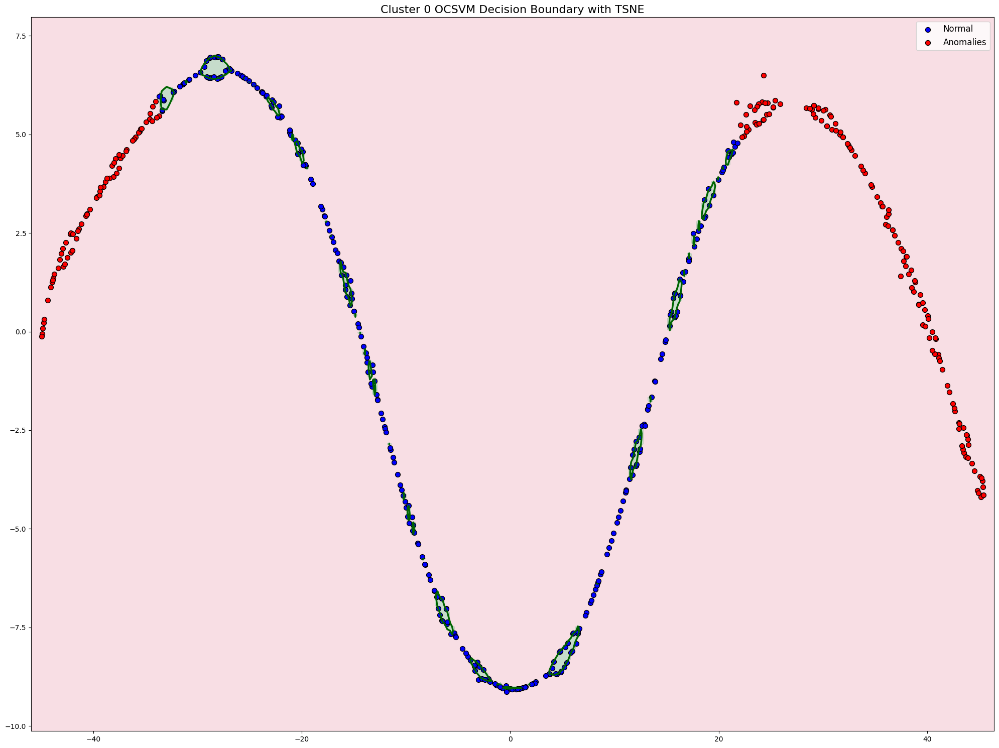

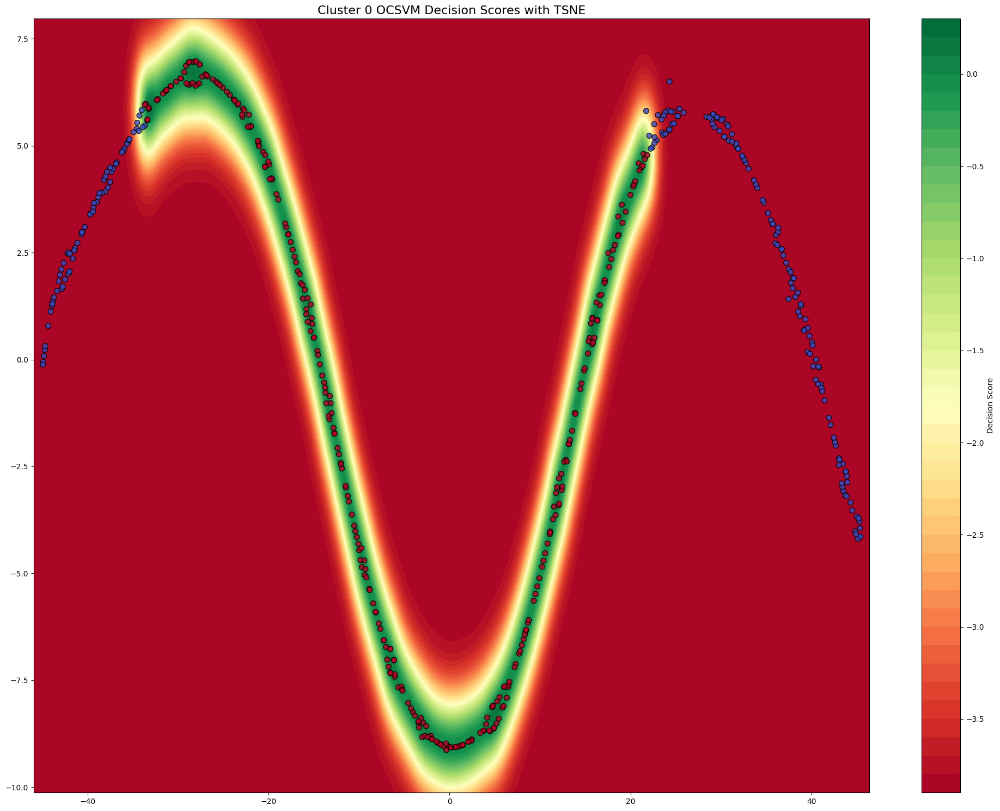

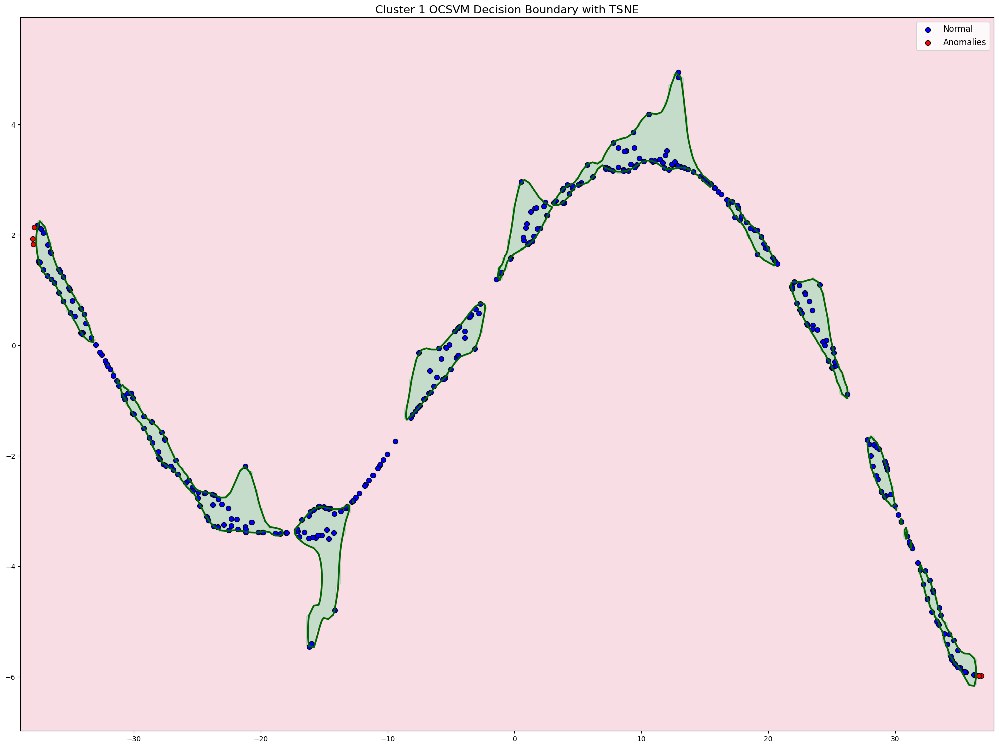

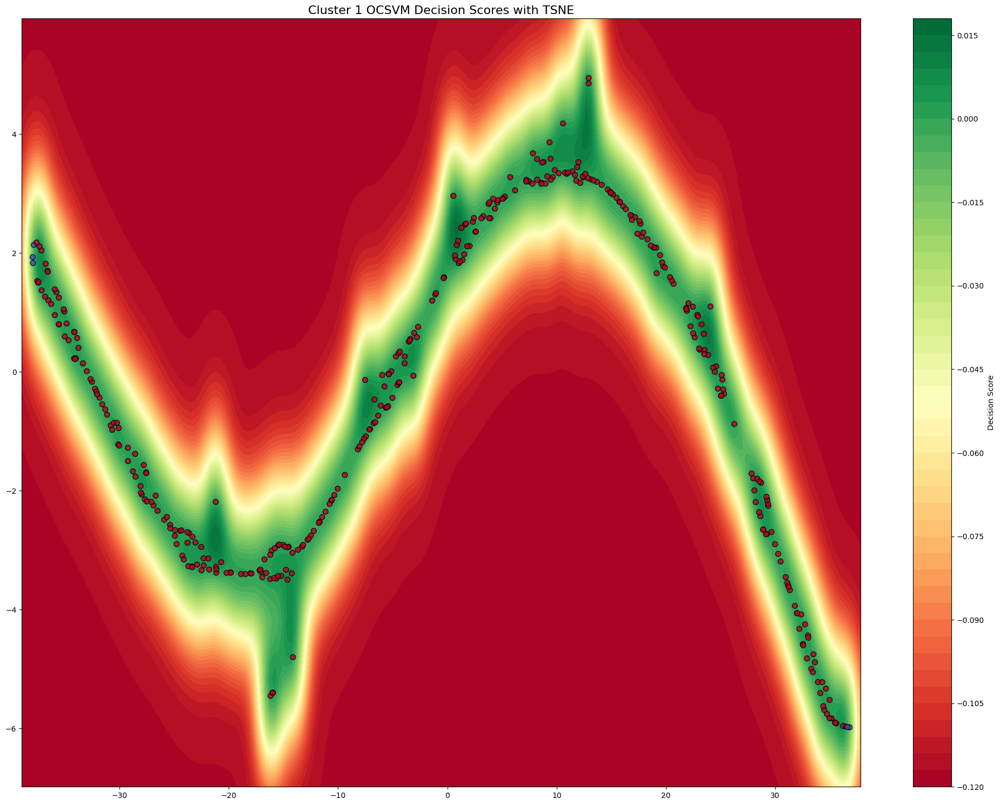

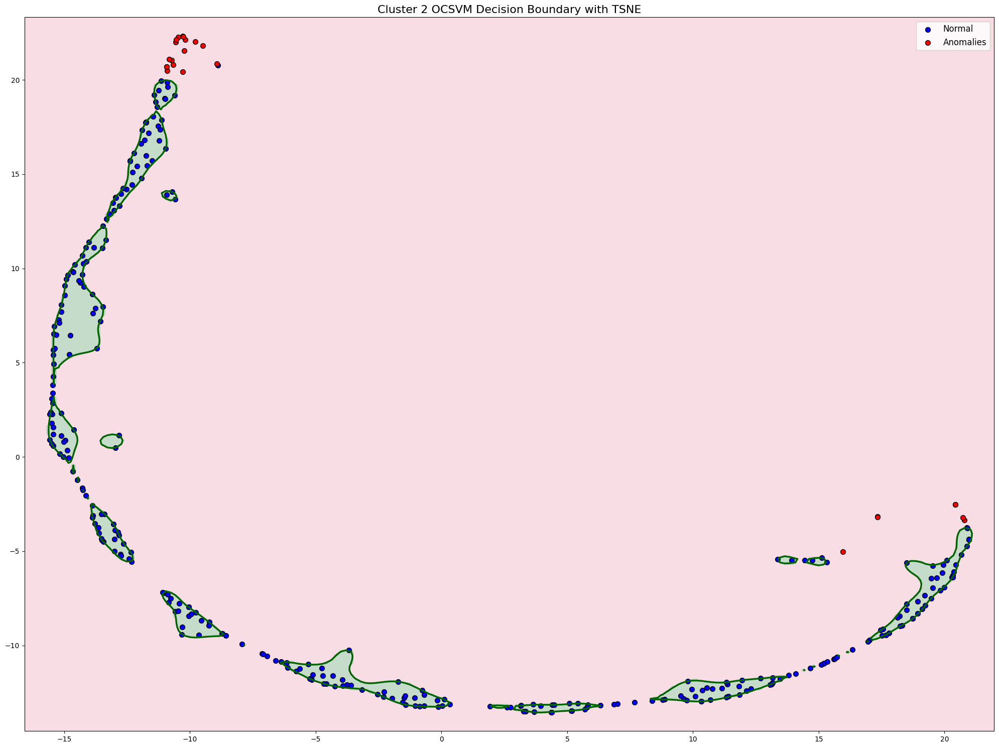

...

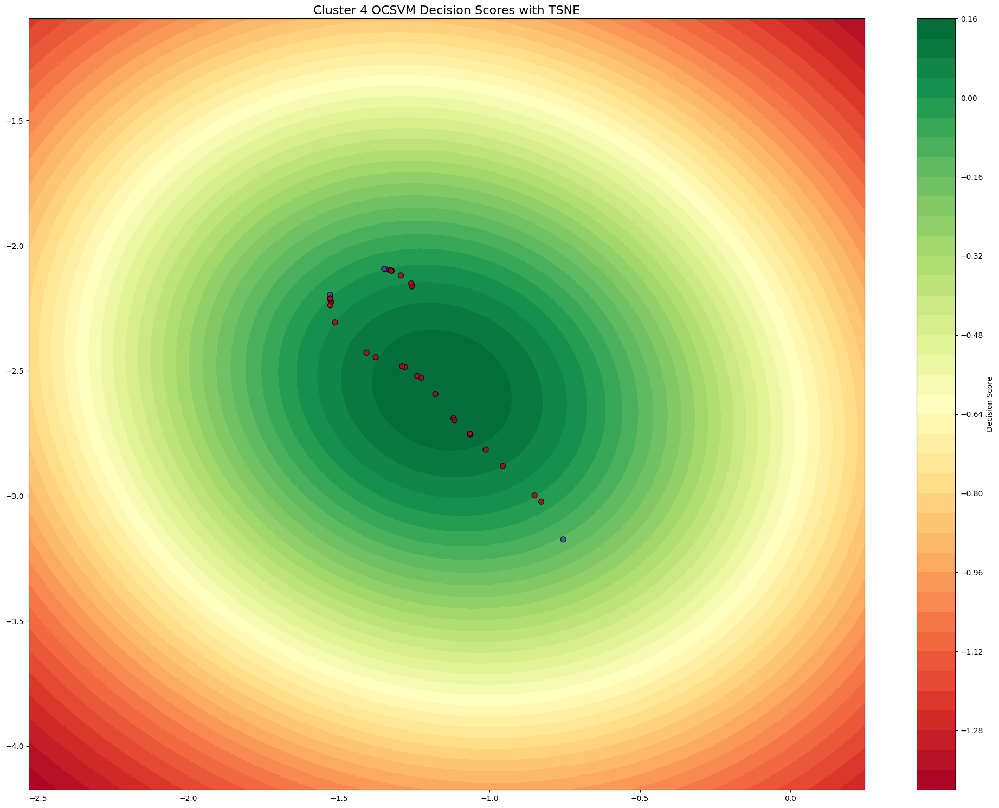

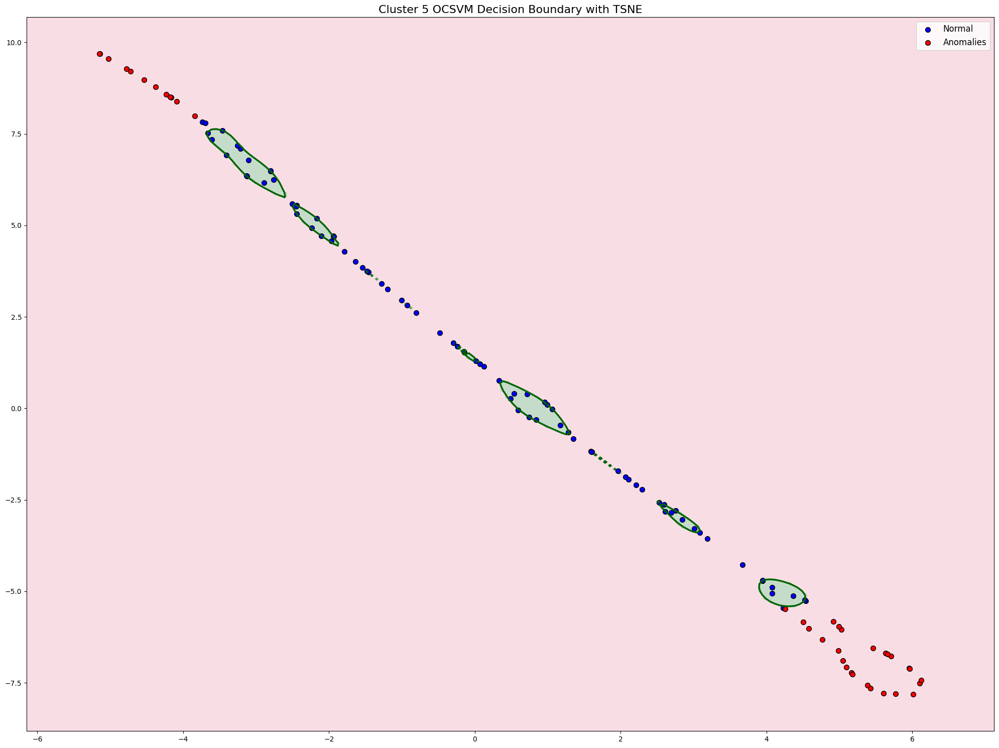

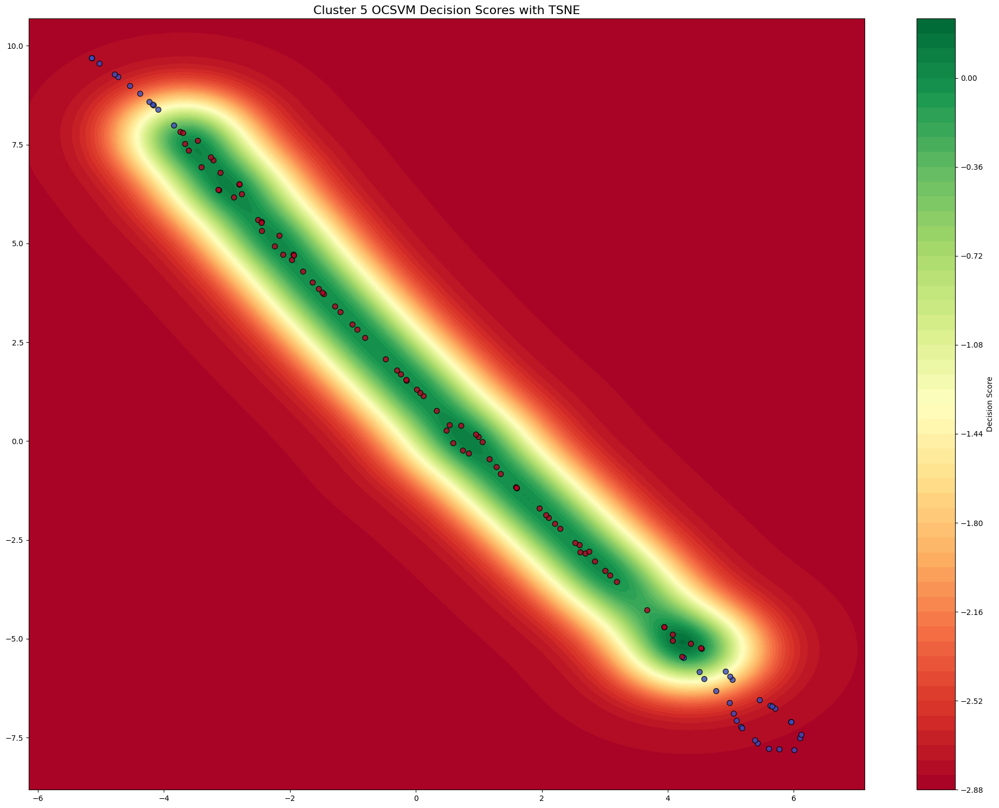

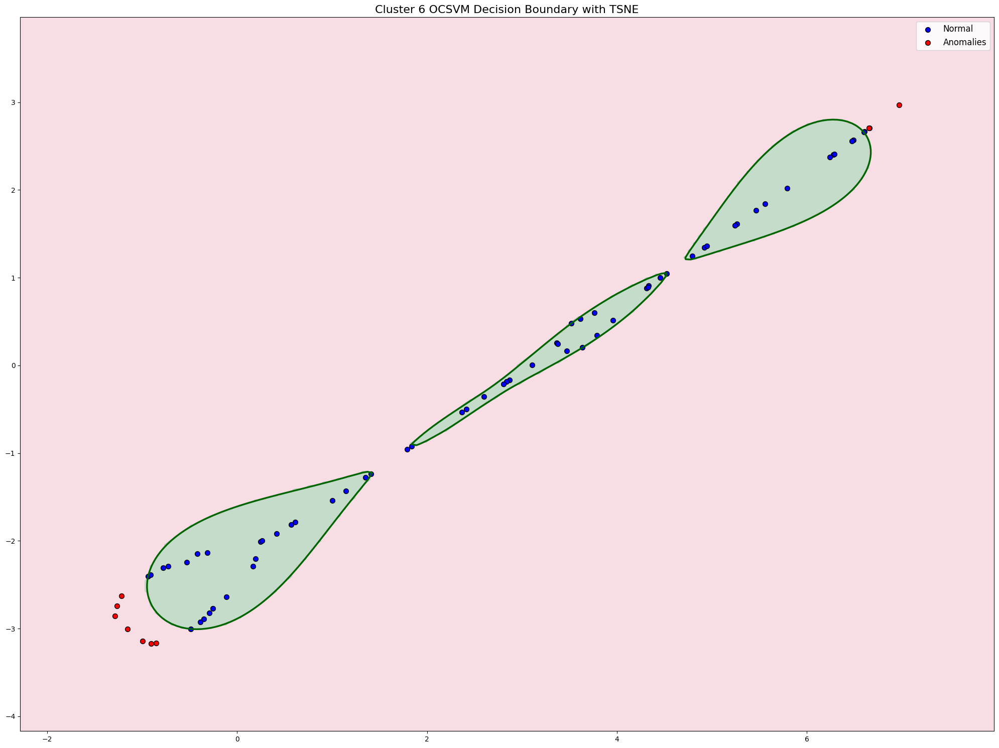

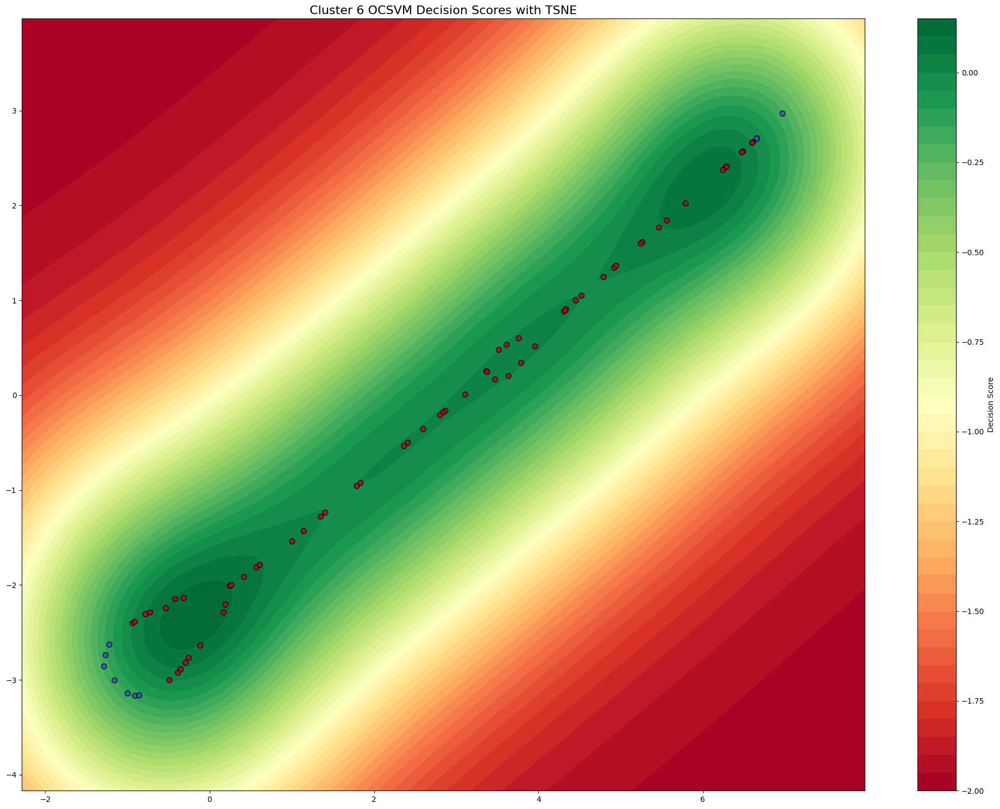

{np.int64(0): TSNE(perplexity=30, random_state=42),
 np.int64(1): TSNE(perplexity=30, random_state=42),
 np.int64(2): TSNE(perplexity=30, random_state=42),
 np.int64(3): TSNE(perplexity=30, random_state=42),
 np.int64(4): TSNE(perplexity=30, random_state=42),
 np.int64(5): TSNE(perplexity=30, random_state=42),
 np.int64(6): TSNE(perplexity=30, random_state=42)}

In [19]:
# Or use t-SNE instead
dbocsvm.visualize_decision_boundaries(X_train_full_encoded, method="tsne")

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


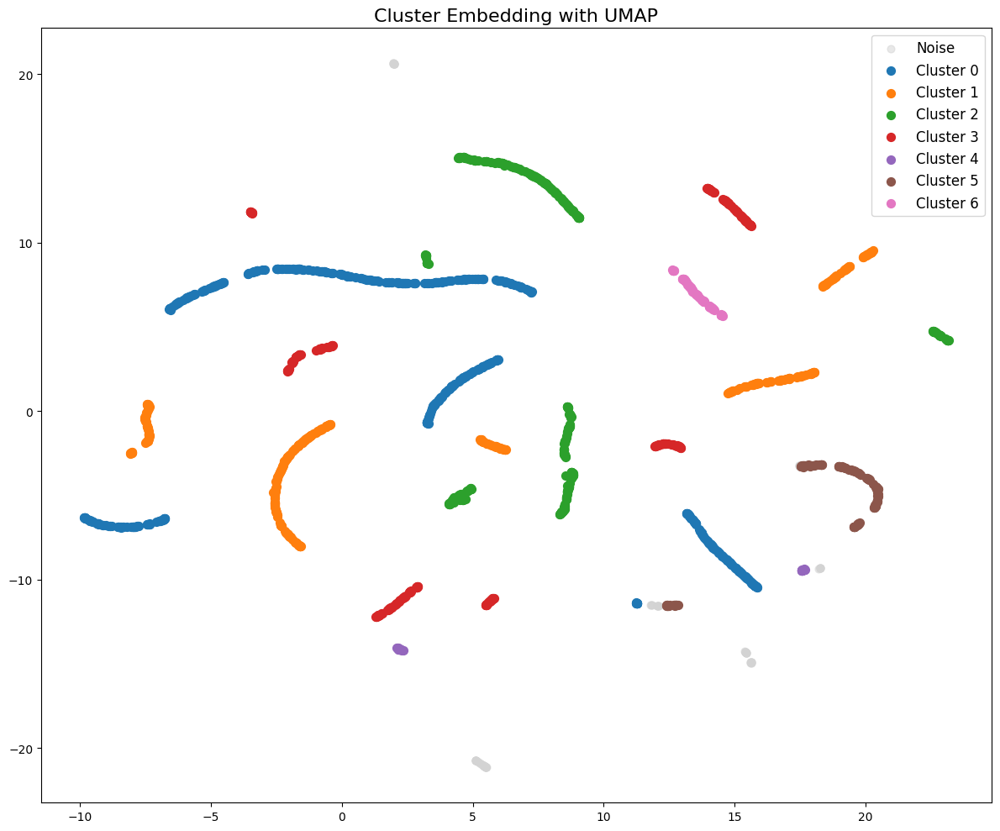

UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [20]:
# Get a global overview of clusters
dbocsvm.plot_cluster_embedding(X_train_full_encoded)

prediction on the model

In [21]:
X_test_tensor = torch.FloatTensor(X_test).to(device)
X_test_encoded = []

test_dataset = TensorDataset(X_test_tensor, torch.zeros(len(X_test_tensor)))
test_loader = DataLoader(test_dataset, batch_size=128)

with torch.no_grad():
    for data, _ in test_loader:
        encoded = autoencoder.encode(data)
        X_test_encoded.append(encoded.cpu().numpy())

X_test_encoded = np.vstack(X_test_encoded)
print(X_test_encoded.shape)

(20000, 10)


In [22]:
y_pred = dbocsvm.predict(X_test_encoded)

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


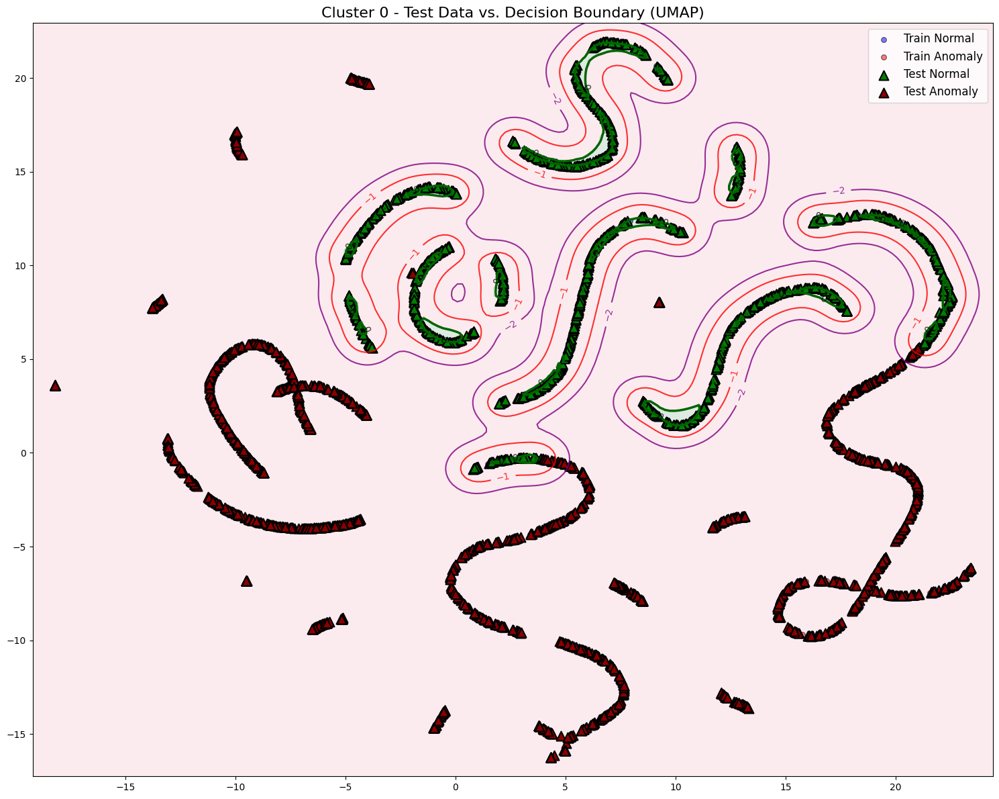

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


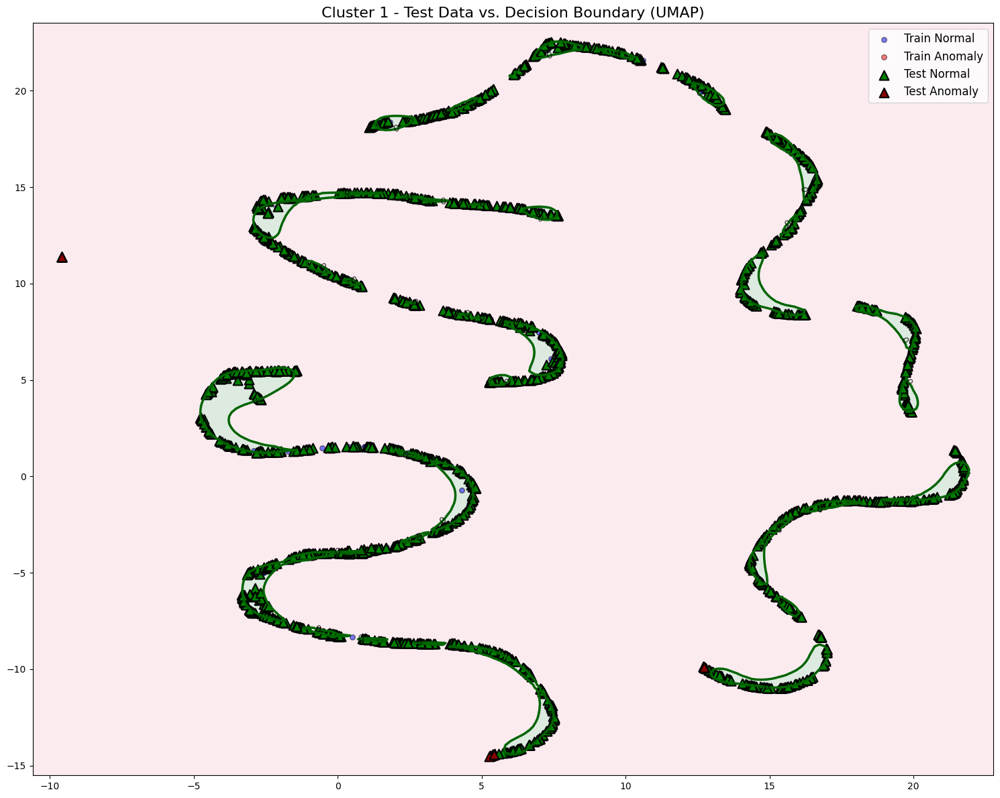

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


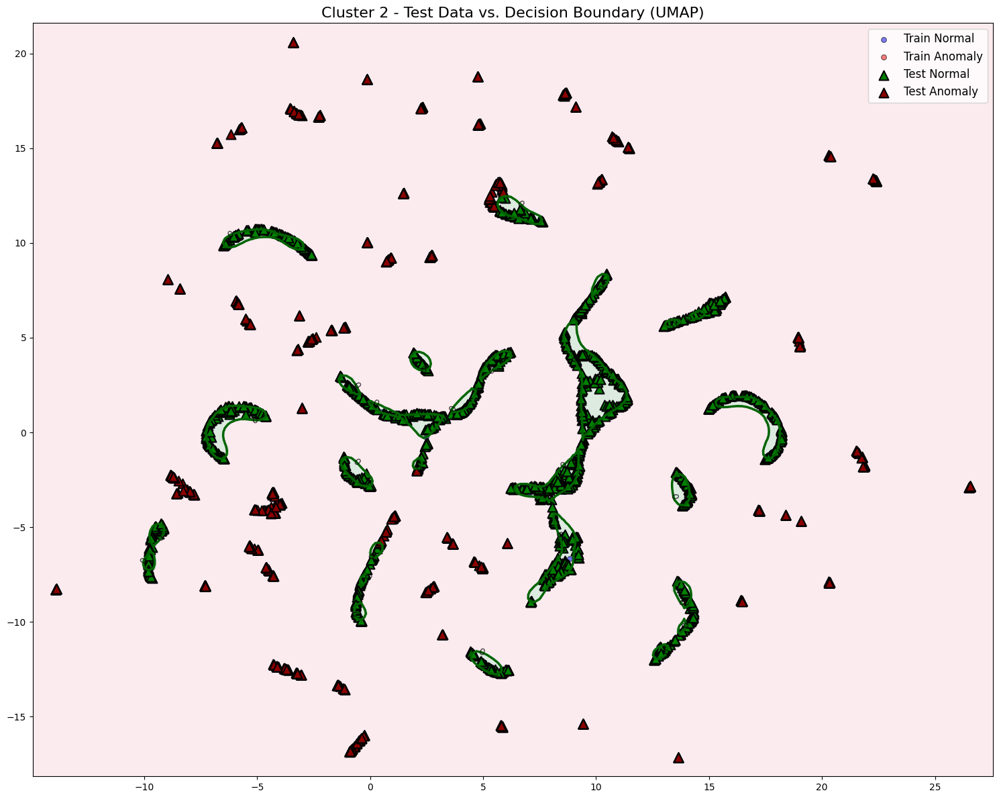

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


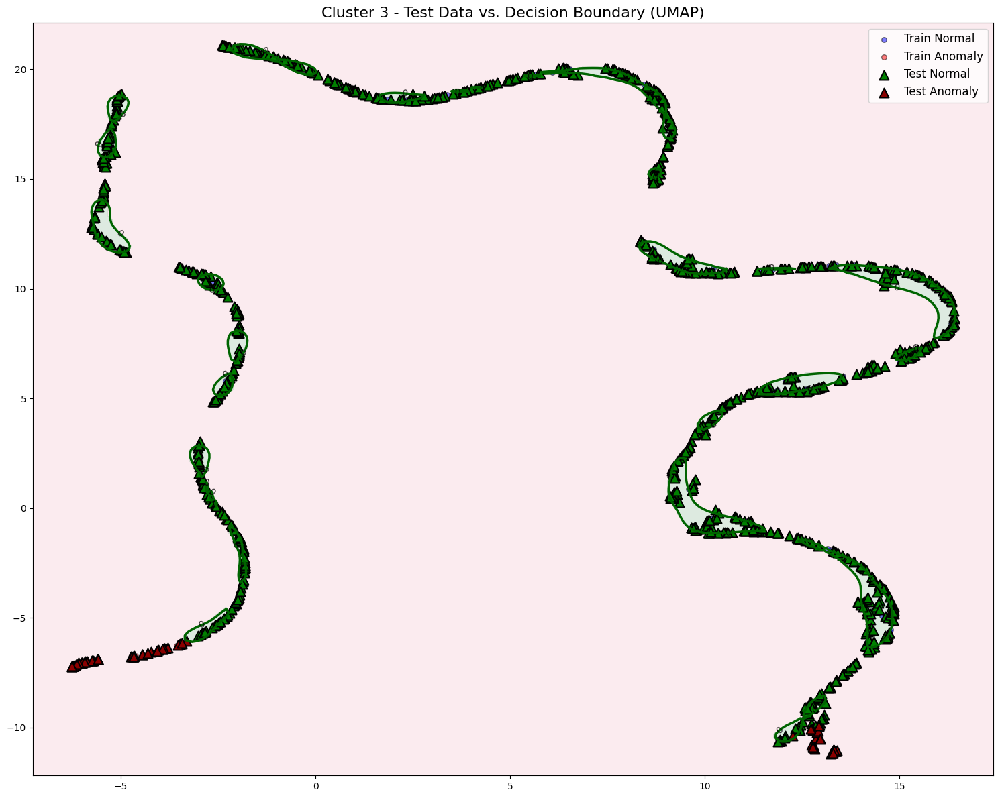

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


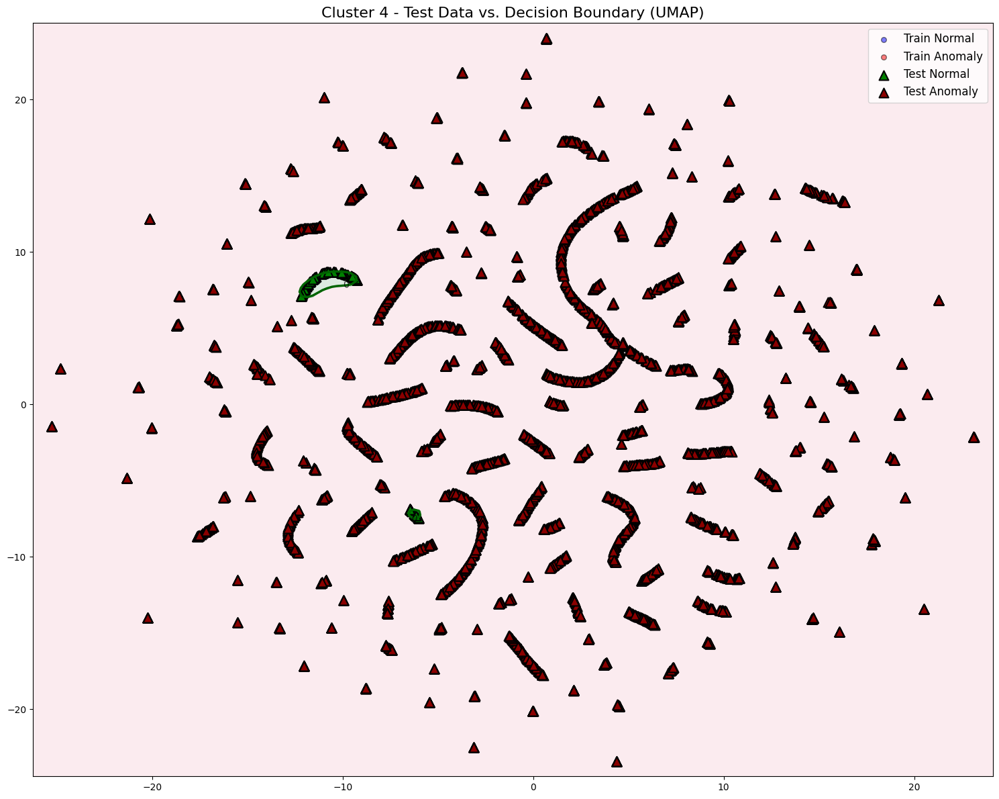

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


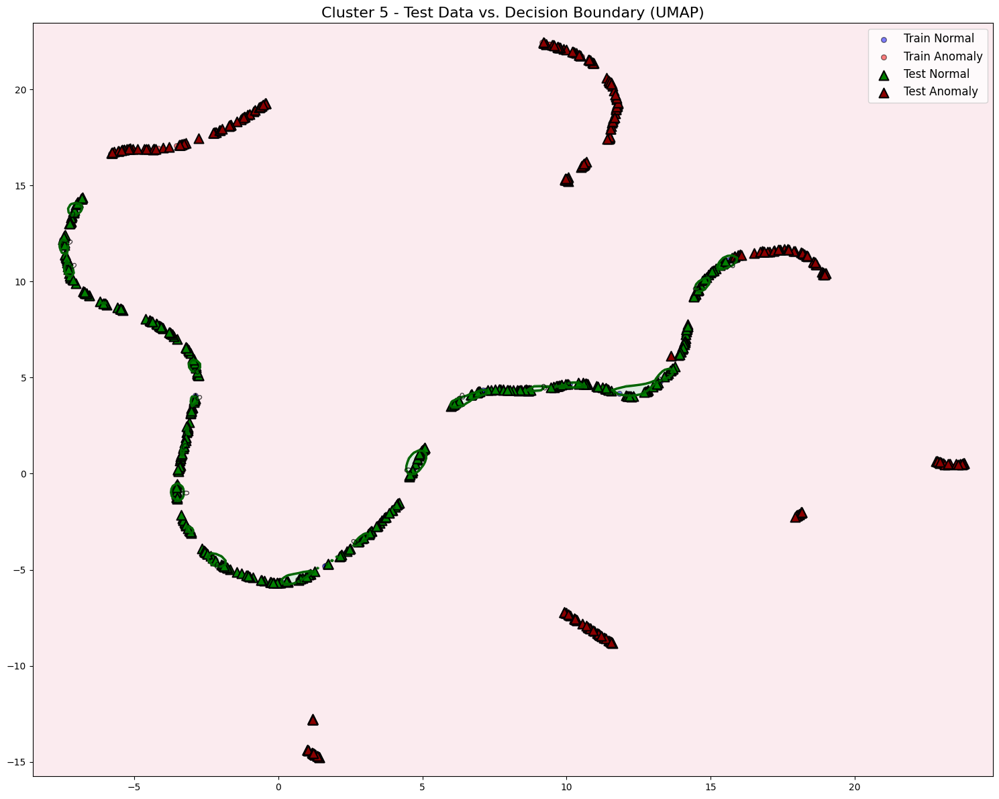

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


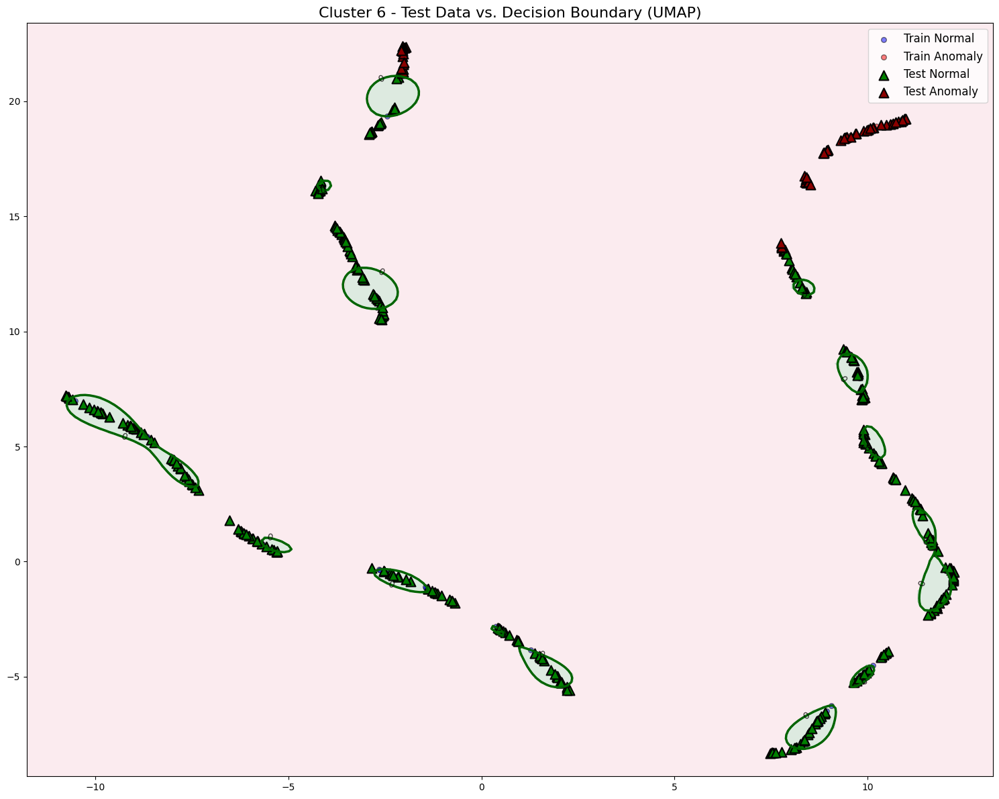

{np.int64(0): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(1): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(2): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(3): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(4): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}),
 np.int64(5): UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_for

In [23]:
# Visualize test data for all clusters
dbocsvm.visualize_test_data(X_train_full_encoded, X_test_encoded, y_pred)

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


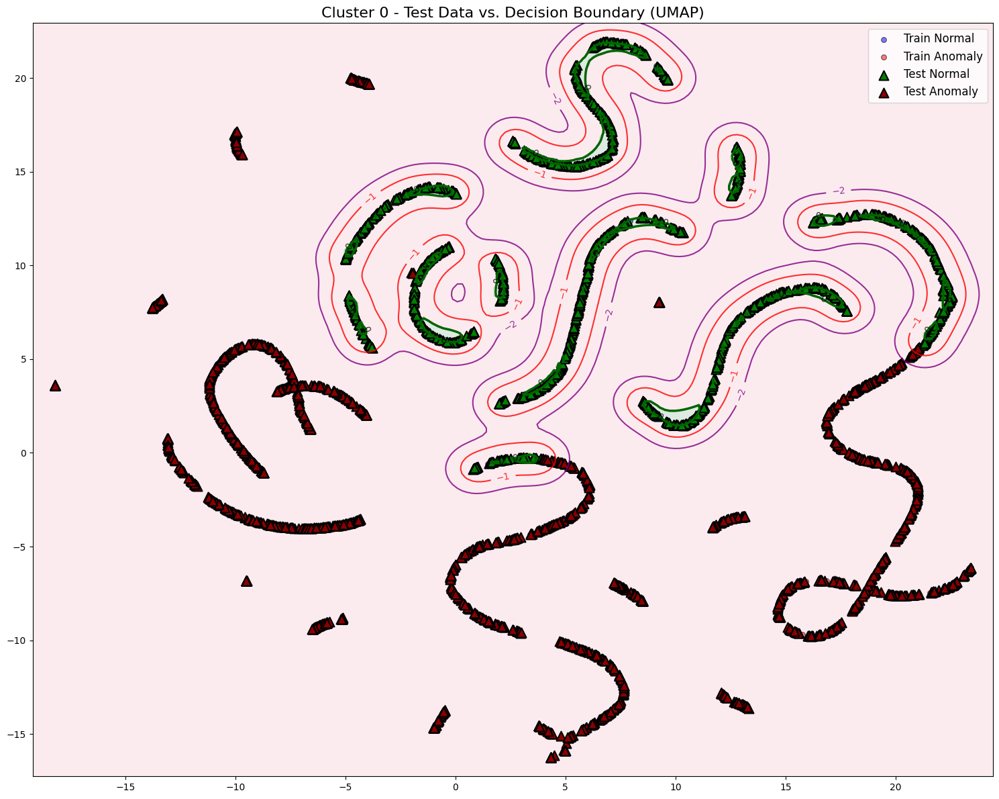

{0: UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})}

In [24]:
# Visualize test data for a specific cluster
dbocsvm.visualize_test_data(X_train_full_encoded, X_test_encoded, y_pred, cluster_id=0)

/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 2000 with accuracies 
[4.60973335e-11 4.49392428e-07 1.09402605e-07 6.55135862e-06]
not reaching the requested tolerance 1.4901161193847656e-06.
Use iteration 1636 instead with accuracy 
9.213882950841578e-07.

  _, diffusion_map = lobpcg(
/home/jbct/Projects/thesis/db-ocsvm/venv/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[9.02465623e-12 4.86299498e-07 9.46156573e-08 3.10454838e-06]
not reaching the requested tolerance 1.4901161193847656e-06.
  _, diffusion_map = lobpcg(


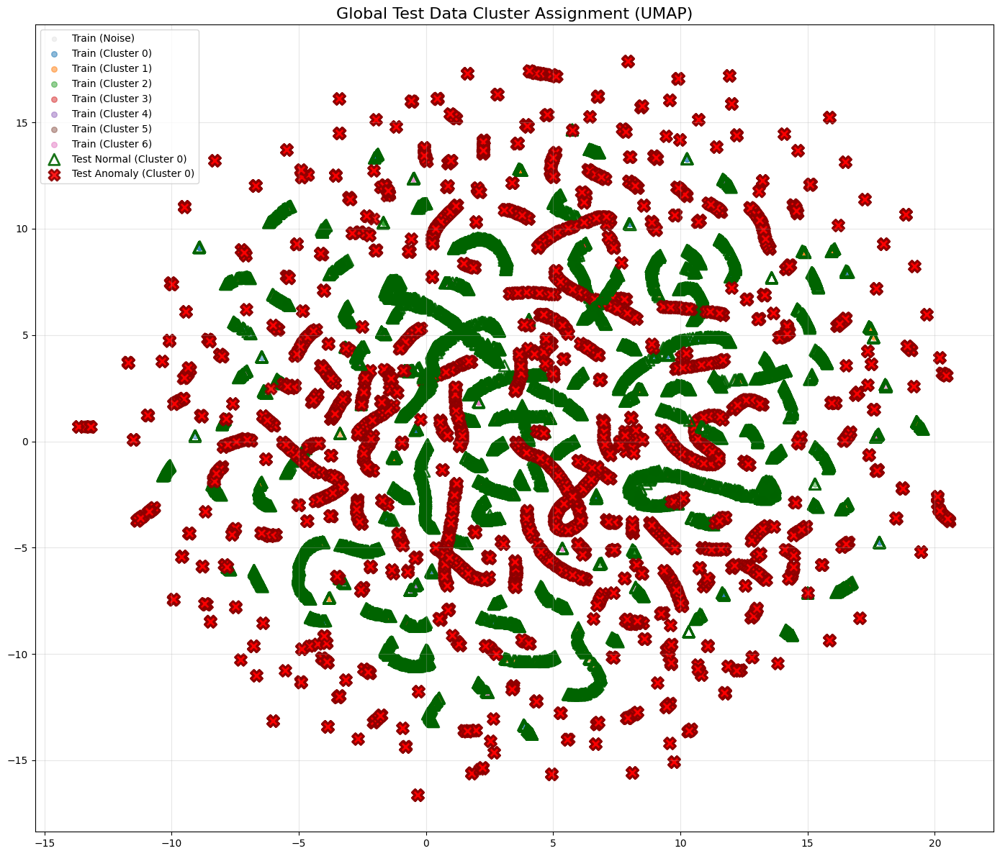

UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [25]:
# Get global view of test point assignments
dbocsvm.plot_global_test_assignment(X_train_full_encoded, X_test_encoded, y_pred)

evaluating the model

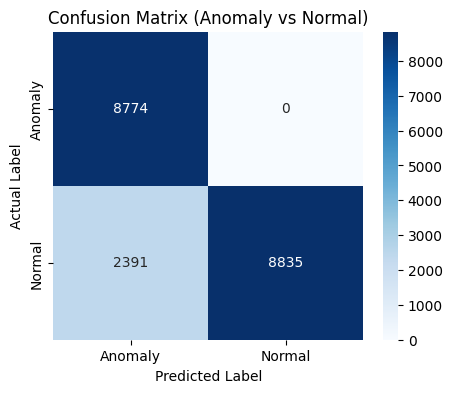

In [26]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred, labels=[-1, 1])


def plot_confusion_matrix(cm, labels, title):
    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels
    )
    plt.xlabel("Predicted Label")
    plt.ylabel("Actual Label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(cm, ["Anomaly", "Normal"], "Confusion Matrix (Anomaly vs Normal)")

In [27]:
from sklearn.metrics import (
    classification_report,
    precision_score,
    recall_score,
    f1_score,
    accuracy_score,
)

print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=["Anomaly", "Normal"]))

precision = precision_score(y_test, y_pred, pos_label=-1)
recall = recall_score(y_test, y_pred, pos_label=-1)
f1 = f1_score(y_test, y_pred, pos_label=-1)
acc = accuracy_score(y_test, y_pred)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {acc}")

Classification Report:
              precision    recall  f1-score   support

     Anomaly       0.79      1.00      0.88      8774
      Normal       1.00      0.79      0.88     11226

    accuracy                           0.88     20000
   macro avg       0.89      0.89      0.88     20000
weighted avg       0.91      0.88      0.88     20000

Precision: 0.7858486341244962
Recall: 1.0
F1 Score: 0.8800842569838006
Accuracy: 0.88045


In [28]:
precision_1 = precision_score(y_test, y_pred, pos_label=1)
recall_1 = recall_score(y_test, y_pred, pos_label=1)
f1_1 = f1_score(y_test, y_pred, pos_label=1)

print(f"Precision: {precision_1}")
print(f"Recall: {recall_1}")
print(f"F1 Score: {f1_1}")

Precision: 1.0
Recall: 0.7870122928915019
F1 Score: 0.8808135187677584


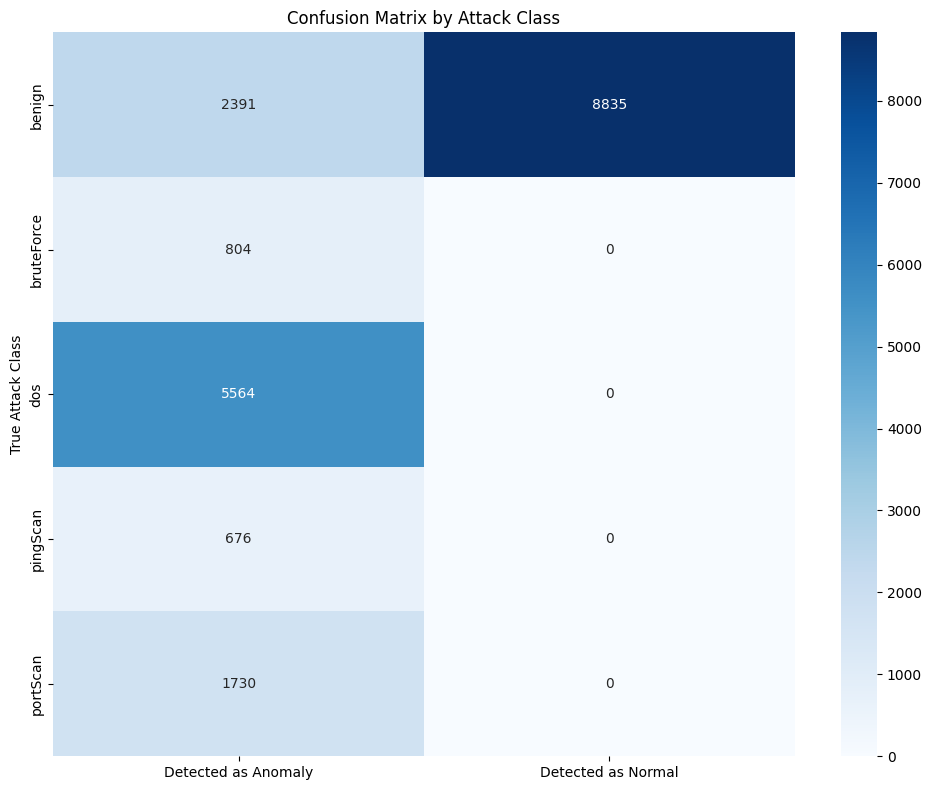

In [29]:
def create_multiclass_cm(y_true_class, y_pred_binary):
    """
    Create a confusion matrix showing how each attack class was classified.

    For attack classes (DoS, Probe, R2L, U2R), correct detection is when y_pred = -1 (anomaly)
    For normal class, correct detection is when y_pred = 1 (normal)
    """
    classes = np.unique(y_true_class)
    cm = np.zeros((len(classes), 2))

    for i, cls in enumerate(classes):
        # Get predictions for this class
        cls_indices = y_true_class == cls
        preds = y_pred_binary[cls_indices]

        # Count correct and incorrect predictions
        if cls == "normal":
            cm[i, 0] = np.sum(preds == -1)  # incorrectly detected as anomaly
            cm[i, 1] = np.sum(preds == 1)  # correctly detected as normal
        else:
            cm[i, 0] = np.sum(preds == -1)  # correctly detected as anomaly
            cm[i, 1] = np.sum(preds == 1)  # incorrectly detected as normal

    return cm, classes


# Create and plot the multi-class confusion matrix
cm_multi, classes = create_multiclass_cm(y_test_class, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm_multi,
    annot=True,
    fmt="g",
    cmap="Blues",
    xticklabels=["Detected as Anomaly", "Detected as Normal"],
    yticklabels=classes,
)
plt.ylabel("True Attack Class")
plt.title("Confusion Matrix by Attack Class")
plt.tight_layout()
plt.show()

In [30]:
# Calculate detection rates for each class
print("Detection rates by class:")
class_metrics = {}
for cls in np.unique(y_test_class):
    # Get indices for this class
    class_indices = y_test_class == cls

    # True values and predictions for this class
    y_true_cls = y_test[class_indices]
    y_pred_cls = y_pred[class_indices]

    # Calculate metrics
    if cls == "Normal":
        # For normal class, we want to detect 1 (normal)
        correct = np.sum((y_pred_cls == 1))
        precision = precision_score(
            y_true_cls, y_pred_cls, pos_label=1, zero_division=0
        )
        recall = recall_score(y_true_cls, y_pred_cls, pos_label=1, zero_division=0)
    else:
        # For attack classes, we want to detect -1 (anomaly)
        correct = np.sum((y_pred_cls == -1))
        precision = precision_score(
            y_true_cls, y_pred_cls, pos_label=-1, zero_division=0
        )
        recall = recall_score(y_true_cls, y_pred_cls, pos_label=-1, zero_division=0)

    total = len(y_pred_cls)
    detection_rate = correct / total
    f1 = f1_score(
        y_true_cls, y_pred_cls, pos_label=-1 if cls != "Normal" else 1, zero_division=0
    )

    class_metrics[cls] = {
        "detection_rate": detection_rate,
        "precision": precision,
        "recall": recall,
        "f1_score": f1,
        "count": total,
        "correctly_detected": correct,
    }

    print(f"{cls}: {detection_rate:.4f} ({correct}/{total})")

Detection rates by class:
benign: 0.2130 (2391/11226)
bruteForce: 1.0000 (804/804)
dos: 1.0000 (5564/5564)
pingScan: 1.0000 (676/676)
portScan: 1.0000 (1730/1730)
